In [1]:
5

5

# 1. Raw Data

In [4]:
import os
from collections import Counter

base_path = 'plantvillage dataset\color'
counts = {}

for class_name in os.listdir(base_path):
    path = os.path.join(base_path, class_name)
    if os.path.isdir(path):
        counts[class_name] = len(os.listdir(path))

print(Counter(counts))


Counter({'Orange___Haunglongbing_(Citrus_greening)': 5507, 'Tomato___Tomato_Yellow_Leaf_Curl_Virus': 5357, 'Soybean___healthy': 5090, 'Peach___Bacterial_spot': 2297, 'Tomato___Bacterial_spot': 2127, 'Tomato___Late_blight': 1909, 'Squash___Powdery_mildew': 1835, 'Tomato___Septoria_leaf_spot': 1771, 'Tomato___Spider_mites Two-spotted_spider_mite': 1676, 'Apple___healthy': 1645, 'Tomato___healthy': 1591, 'Blueberry___healthy': 1502, 'Pepper,_bell___healthy': 1478, 'Tomato___Target_Spot': 1404, 'Grape___Esca_(Black_Measles)': 1383, 'Corn_(maize)___Common_rust_': 1192, 'Grape___Black_rot': 1180, 'Corn_(maize)___healthy': 1162, 'Strawberry___Leaf_scorch': 1109, 'Grape___Leaf_blight_(Isariopsis_Leaf_Spot)': 1076, 'Cherry_(including_sour)___Powdery_mildew': 1052, 'Potato___Early_blight': 1000, 'Potato___Late_blight': 1000, 'Tomato___Early_blight': 1000, 'Pepper,_bell___Bacterial_spot': 997, 'Corn_(maize)___Northern_Leaf_Blight': 985, 'Tomato___Leaf_Mold': 952, 'Cherry_(including_sour)___health

In [3]:
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import os
import random
from sklearn.utils import class_weight
from sklearn.preprocessing import LabelEncoder
from tensorflow.keras import layers, models
from tensorflow.keras.preprocessing import image_dataset_from_directory
from helper_functions import *

In [17]:
# 1. Load only 10% of data manually
def sample_10_percent_data(dataset_dir, temp_dir):
    """
    Copies only 10% of images from each class to a temporary folder for testing
    """
    import shutil
    from pathlib import Path

    if os.path.exists(temp_dir):
        shutil.rmtree(temp_dir)
    os.makedirs(temp_dir)

    for class_dir in os.listdir(dataset_dir):
        full_class_path = os.path.join(dataset_dir, class_dir)
        if not os.path.isdir(full_class_path):
            continue

        files = os.listdir(full_class_path)
        sample_count = max(1, len(files) // 10)
        sampled_files = random.sample(files, sample_count)

        dest_class_dir = os.path.join(temp_dir, class_dir)
        os.makedirs(dest_class_dir, exist_ok=True)

        for file in sampled_files:
            shutil.copy(os.path.join(full_class_path, file), os.path.join(dest_class_dir, file))

In [18]:
# Directories
ORIG_DATASET = "plantvillage dataset\color"     # original dataset path
TEMP_DATASET = "plantvillage_10"  # temporary folder for 10% sampled data

# Sample 10% of data
sample_10_percent_data(ORIG_DATASET, TEMP_DATASET)

# 2. Load the data using Keras utility
BATCH_SIZE = 32
IMG_SIZE = (128, 128)

train_ds = image_dataset_from_directory(
    TEMP_DATASET,
    validation_split=0.2,
    subset="training",
    seed=42,
    image_size=IMG_SIZE,
    batch_size=BATCH_SIZE
)

val_ds = image_dataset_from_directory(
    TEMP_DATASET,
    validation_split=0.2,
    subset="validation",
    seed=42,
    image_size=IMG_SIZE,
    batch_size=BATCH_SIZE
)

Found 5417 files belonging to 38 classes.
Using 4334 files for training.
Found 5417 files belonging to 38 classes.
Using 1083 files for validation.


In [17]:
# 3. Preprocessing (normalization)
AUTOTUNE = tf.data.AUTOTUNE

# Extract class_names before further dataset transformations
# class_names = train_ds.class_names
# label_map = {name: i for i, name in enumerate(class_names)}

# Now apply transformations
train_ds = train_ds.cache().shuffle(1000).prefetch(buffer_size=AUTOTUNE)
val_ds = val_ds.cache().prefetch(buffer_size=AUTOTUNE)

y_train = []
for images, labels in train_ds.unbatch():
    y_train.append(labels.numpy())

class_weights = class_weight.compute_class_weight(
    class_weight='balanced',
    classes=np.unique(y_train),
    y=y_train
)
class_weights = dict(enumerate(class_weights))

print("Class Weights:", class_weights)

Class Weights: {0: np.float64(2.0736842105263156), 1: np.float64(2.1519364448857994), 2: np.float64(6.002770083102493), 3: np.float64(0.8325009604302728), 4: np.float64(0.8841289269685843), 5: np.float64(1.3908857509627728), 6: np.float64(1.58406432748538), 7: np.float64(2.7817715019255456), 8: np.float64(1.2263723825693265), 9: np.float64(1.481203007518797), 10: np.float64(1.2397025171624714), 11: np.float64(1.2133258678611423), 12: np.float64(0.9917620137299771), 13: np.float64(1.3577694235588973), 14: np.float64(2.7817715019255456), 15: np.float64(0.25921052631578945), 16: np.float64(0.6517293233082707), 17: np.float64(3.456140350877193), 18: np.float64(1.3577694235588973), 19: np.float64(0.9504385964912281), 20: np.float64(1.4080571799870045), 21: np.float64(1.3908857509627728), 22: np.float64(11.405263157894737), 23: np.float64(4.75219298245614), 24: np.float64(0.2916947099205815), 25: np.float64(0.8511390416339356), 26: np.float64(1.3577694235588973), 27: np.float64(3.45614035087

In [20]:
# 5. Build CNN model (from scratch)
model = models.Sequential([
    layers.Rescaling(1./255, input_shape=(128, 128, 3)),

    layers.Conv2D(32, 3, activation='relu'),
    layers.MaxPooling2D(),

    layers.Conv2D(64, 3, activation='relu'),
    layers.MaxPooling2D(),

    layers.Conv2D(128, 3, activation='relu'),
    layers.MaxPooling2D(),

    layers.Flatten(),
    layers.Dense(128, activation='relu'),
    layers.Dropout(0.5),
    layers.Dense(38, activation='softmax')
])

# 6. Compile model
model.compile(optimizer='adam',
              loss='sparse_categorical_crossentropy',
              metrics=['accuracy'])

## epochs = 5

In [21]:
# # 7. Train the model with class weights
# history = model.fit(
#     train_ds,
#     validation_data=val_ds,
#     epochs=5,
#     class_weight=class_weights
# )

Epoch 1/5
136/136 ━━━━━━━━━━━━━━━━━━━━ 26s 186ms/step - accuracy: 0.0374 - loss: 3.6759 - val_accuracy: 0.0776 - val_loss: 3.3761
Epoch 2/5
136/136 ━━━━━━━━━━━━━━━━━━━━ 27s 201ms/step - accuracy: 0.1006 - loss: 3.3678 - val_accuracy: 0.2031 - val_loss: 2.9579
Epoch 3/5
136/136 ━━━━━━━━━━━━━━━━━━━━ 28s 203ms/step - accuracy: 0.2065 - loss: 2.8736 - val_accuracy: 0.3813 - val_loss: 2.3191
Epoch 4/5
136/136 ━━━━━━━━━━━━━━━━━━━━ 28s 209ms/step - accuracy: 0.3333 - loss: 2.3129 - val_accuracy: 0.5097 - val_loss: 1.7676
Epoch 5/5
136/136 ━━━━━━━━━━━━━━━━━━━━ 27s 202ms/step - accuracy: 0.4390 - loss: 1.8387 - val_accuracy: 0.5854 - val_loss: 1.4668


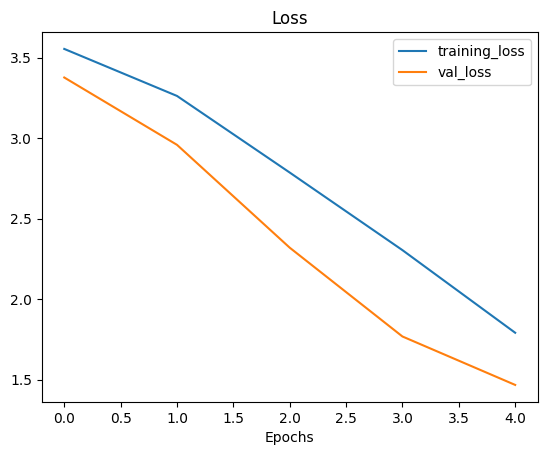

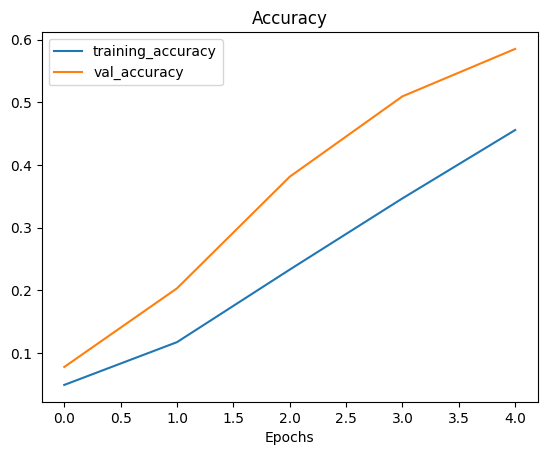

In [31]:
plot_loss_curves(history)

## epochs = 10

In [32]:
# history2 = model.fit(
#     train_ds,
#     validation_data=val_ds,
#     epochs=10,
#     class_weight=class_weights
# )

Epoch 1/10
136/136 ━━━━━━━━━━━━━━━━━━━━ 26s 189ms/step - accuracy: 0.5275 - loss: 1.4970 - val_accuracy: 0.5983 - val_loss: 1.3992
Epoch 2/10
136/136 ━━━━━━━━━━━━━━━━━━━━ 34s 253ms/step - accuracy: 0.5718 - loss: 1.2754 - val_accuracy: 0.6602 - val_loss: 1.1534
Epoch 3/10
136/136 ━━━━━━━━━━━━━━━━━━━━ 29s 211ms/step - accuracy: 0.6398 - loss: 1.1065 - val_accuracy: 0.6990 - val_loss: 1.0408
Epoch 4/10
136/136 ━━━━━━━━━━━━━━━━━━━━ 30s 222ms/step - accuracy: 0.6755 - loss: 1.0058 - val_accuracy: 0.6584 - val_loss: 1.1340
Epoch 5/10
136/136 ━━━━━━━━━━━━━━━━━━━━ 36s 262ms/step - accuracy: 0.7173 - loss: 0.8044 - val_accuracy: 0.7184 - val_loss: 0.9650
Epoch 6/10
136/136 ━━━━━━━━━━━━━━━━━━━━ 29s 215ms/step - accuracy: 0.7577 - loss: 0.6707 - val_accuracy: 0.7119 - val_loss: 0.9691
Epoch 7/10
136/136 ━━━━━━━━━━━━━━━━━━━━ 28s 207ms/step - accuracy: 0.7993 - loss: 0.5455 - val_accuracy: 0.7101 - val_loss: 0.9998
Epoch 8/10
136/136 ━━━━━━━━━━━━━━━━━━━━ 28s 208ms/step - accuracy: 0.8007 - loss: 0

In [33]:
model.evaluate(val_ds)

34/34 ━━━━━━━━━━━━━━━━━━━━ 1s 39ms/step - accuracy: 0.7391 - loss: 1.1242


[0.9498046636581421, 0.7590027451515198]

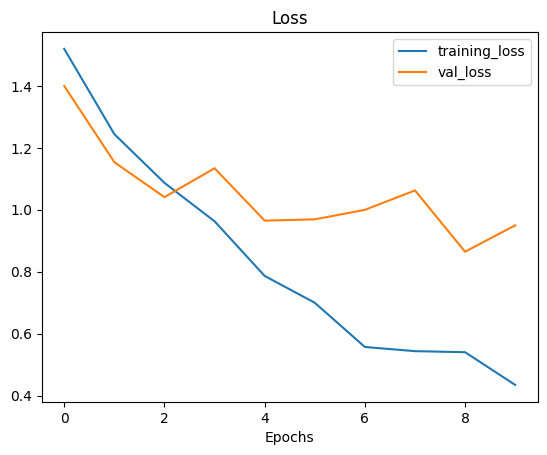

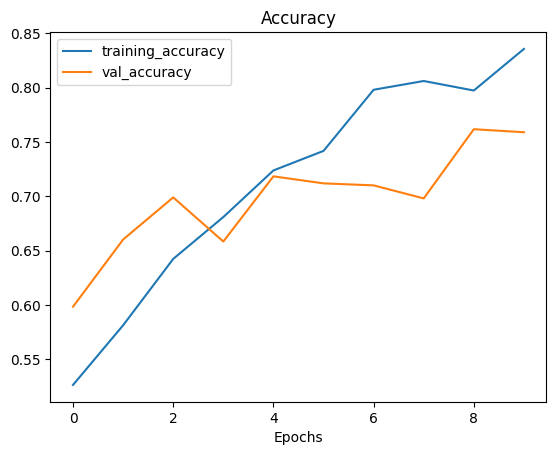

In [34]:
plot_loss_curves(history2)

## Finding Ideal Learning Rate

In [35]:
model.compile(optimizer='adam',
              loss='sparse_categorical_crossentropy',
              metrics=['accuracy'])

lr_scheduler=tf.keras.callbacks.LearningRateScheduler(lambda epoch: 1e-4 * 10**(epoch/20))

# history3 = model.fit(
#     train_ds,
#     validation_data=val_ds,
#     epochs=5,
#     class_weight=class_weights,
#     callbacks=[lr_scheduler]
)

Epoch 1/5
136/136 ━━━━━━━━━━━━━━━━━━━━ 27s 190ms/step - accuracy: 0.8660 - loss: 0.3461 - val_accuracy: 0.7959 - val_loss: 0.7962 - learning_rate: 1.0000e-04
Epoch 2/5
136/136 ━━━━━━━━━━━━━━━━━━━━ 28s 208ms/step - accuracy: 0.8881 - loss: 0.2898 - val_accuracy: 0.7886 - val_loss: 0.8065 - learning_rate: 1.1220e-04
Epoch 3/5
136/136 ━━━━━━━━━━━━━━━━━━━━ 29s 210ms/step - accuracy: 0.9126 - loss: 0.2367 - val_accuracy: 0.7959 - val_loss: 0.8053 - learning_rate: 1.2589e-04
Epoch 4/5
136/136 ━━━━━━━━━━━━━━━━━━━━ 30s 220ms/step - accuracy: 0.9000 - loss: 0.2499 - val_accuracy: 0.7987 - val_loss: 0.8298 - learning_rate: 1.4125e-04
Epoch 5/5
136/136 ━━━━━━━━━━━━━━━━━━━━ 31s 231ms/step - accuracy: 0.9073 - loss: 0.2110 - val_accuracy: 0.8061 - val_loss: 0.8142 - learning_rate: 1.5849e-04


<Axes: xlabel='epochs'>

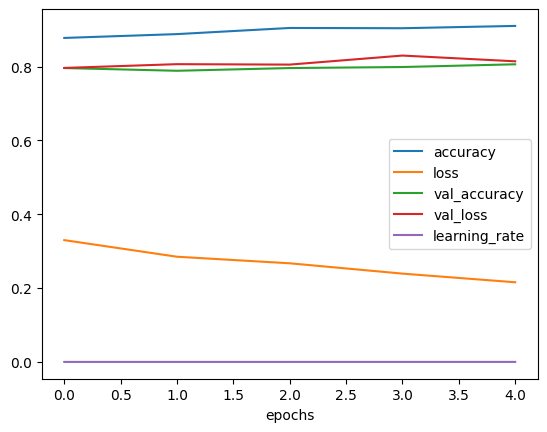

In [37]:
import pandas as pd
pd.DataFrame(history3.history).plot(xlabel="epochs")

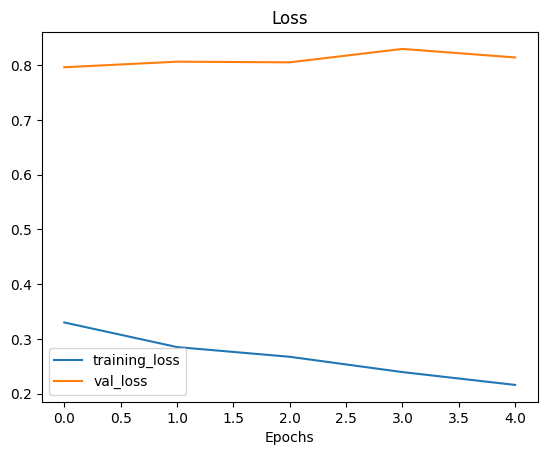

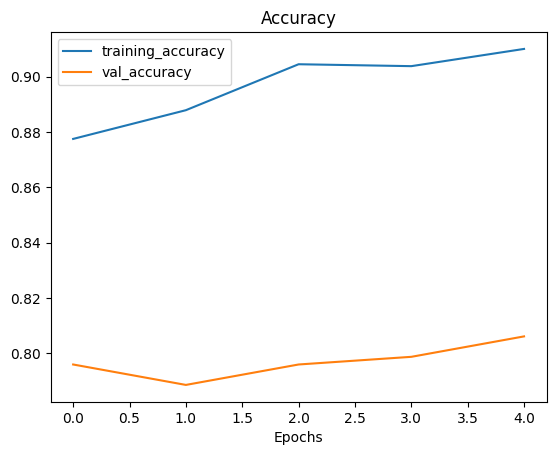

In [38]:
plot_loss_curves(history3)

Text(0.5, 1.0, 'Learning Rate v/s Loss')

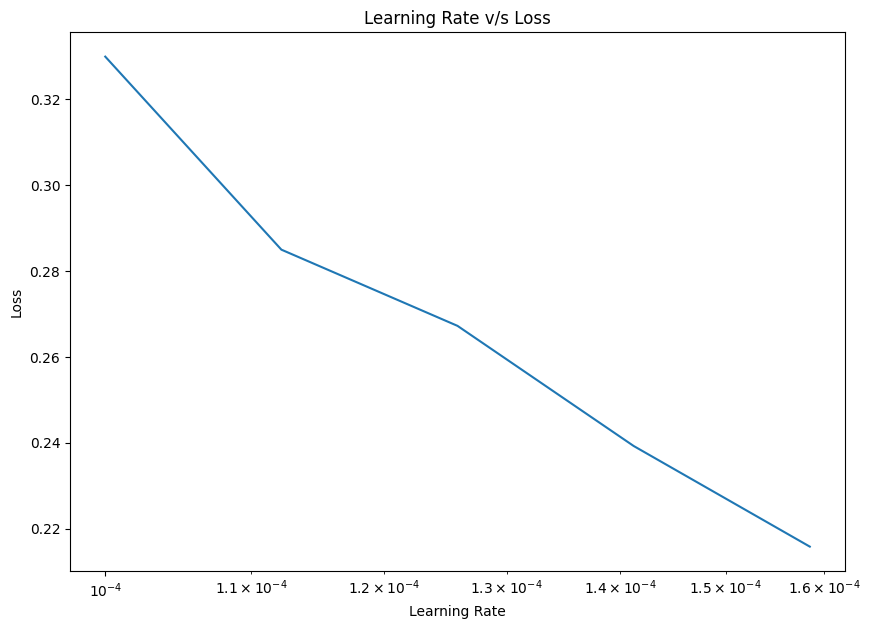

In [43]:
plt.figure(figsize=(10,7))
# Create learning rates array matching the number of epochs in history3
num_epochs = len(history3.history["loss"])
lrs = 1e-4 * (10 ** (tf.range(num_epochs)/20))
plt.semilogx(lrs, history3.history["loss"])
plt.xlabel("Learning Rate")
plt.ylabel("Loss")
plt.title("Learning Rate v/s Loss")

## Using Ideal learning rate

In [45]:
# model.compile(tf.keras.optimizers.Adam(learning_rate=1e-4),
#               loss='sparse_categorical_crossentropy',
#               metrics=['accuracy'])

# history4 = model.fit(
#     train_ds,
#     validation_data=val_ds,
#     epochs=5,
#     class_weight=class_weights,
# )

Epoch 1/5
136/136 ━━━━━━━━━━━━━━━━━━━━ 29s 206ms/step - accuracy: 0.9100 - loss: 0.2280 - val_accuracy: 0.8006 - val_loss: 0.8414
Epoch 2/5
136/136 ━━━━━━━━━━━━━━━━━━━━ 29s 206ms/step - accuracy: 0.9100 - loss: 0.2280 - val_accuracy: 0.8006 - val_loss: 0.8414
Epoch 2/5
136/136 ━━━━━━━━━━━━━━━━━━━━ 29s 210ms/step - accuracy: 0.9187 - loss: 0.2243 - val_accuracy: 0.8033 - val_loss: 0.8239
Epoch 3/5
136/136 ━━━━━━━━━━━━━━━━━━━━ 29s 210ms/step - accuracy: 0.9187 - loss: 0.2243 - val_accuracy: 0.8033 - val_loss: 0.8239
Epoch 3/5
136/136 ━━━━━━━━━━━━━━━━━━━━ 31s 229ms/step - accuracy: 0.9237 - loss: 0.2048 - val_accuracy: 0.7987 - val_loss: 0.8314
Epoch 4/5
136/136 ━━━━━━━━━━━━━━━━━━━━ 31s 229ms/step - accuracy: 0.9237 - loss: 0.2048 - val_accuracy: 0.7987 - val_loss: 0.8314
Epoch 4/5
136/136 ━━━━━━━━━━━━━━━━━━━━ 34s 249ms/step - accuracy: 0.9273 - loss: 0.1825 - val_accuracy: 0.7987 - val_loss: 0.8590
Epoch 5/5
136/136 ━━━━━━━━━━━━━━━━━━━━ 34s 249ms/step - accuracy: 0.9273 - loss: 0.1825 - 

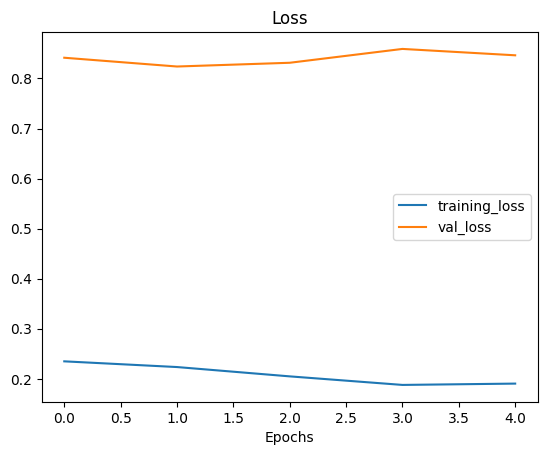

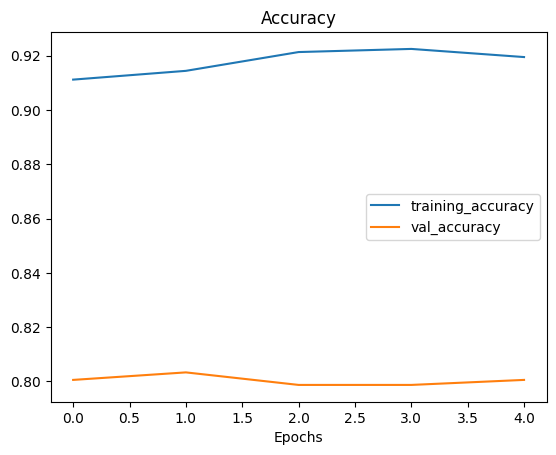

In [49]:
plot_loss_curves(history4)

## Simplify model

In [52]:
model2 = models.Sequential([
    layers.Rescaling(1./255, input_shape=(128, 128, 3)),
    layers.Conv2D(32, 3, activation='relu'),
    layers.MaxPooling2D(),
    layers.Conv2D(64, 3, activation='relu'),
    layers.MaxPooling2D(),
    layers.Flatten(),
    layers.Dense(64, activation='relu'),
    layers.Dropout(0.4),
    layers.Dense(38, activation='softmax')
])


c:\Users\DELL\anaconda3\Lib\site-packages\keras\src\layers\preprocessing\tf_data_layer.py:19: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


In [53]:
# model2.compile(optimizer='adam',
#               loss='sparse_categorical_crossentropy',
#                 metrics=['accuracy'])

# history5 = model2.fit(
#     train_ds,
#     validation_data=val_ds,
#     epochs=5,
#     class_weight=class_weights
)

Epoch 1/5
136/136 ━━━━━━━━━━━━━━━━━━━━ 20s 138ms/step - accuracy: 0.0448 - loss: 3.7774 - val_accuracy: 0.2179 - val_loss: 3.0361
Epoch 2/5
136/136 ━━━━━━━━━━━━━━━━━━━━ 20s 138ms/step - accuracy: 0.0448 - loss: 3.7774 - val_accuracy: 0.2179 - val_loss: 3.0361
Epoch 2/5
136/136 ━━━━━━━━━━━━━━━━━━━━ 26s 194ms/step - accuracy: 0.1912 - loss: 3.0639 - val_accuracy: 0.3463 - val_loss: 2.5203
Epoch 3/5
136/136 ━━━━━━━━━━━━━━━━━━━━ 26s 194ms/step - accuracy: 0.1912 - loss: 3.0639 - val_accuracy: 0.3463 - val_loss: 2.5203
Epoch 3/5
136/136 ━━━━━━━━━━━━━━━━━━━━ 21s 153ms/step - accuracy: 0.3171 - loss: 2.4184 - val_accuracy: 0.5125 - val_loss: 1.7674
Epoch 4/5
136/136 ━━━━━━━━━━━━━━━━━━━━ 21s 153ms/step - accuracy: 0.3171 - loss: 2.4184 - val_accuracy: 0.5125 - val_loss: 1.7674
Epoch 4/5
136/136 ━━━━━━━━━━━━━━━━━━━━ 22s 163ms/step - accuracy: 0.4247 - loss: 1.9580 - val_accuracy: 0.5845 - val_loss: 1.4915
Epoch 5/5
136/136 ━━━━━━━━━━━━━━━━━━━━ 22s 163ms/step - accuracy: 0.4247 - loss: 1.9580 - 

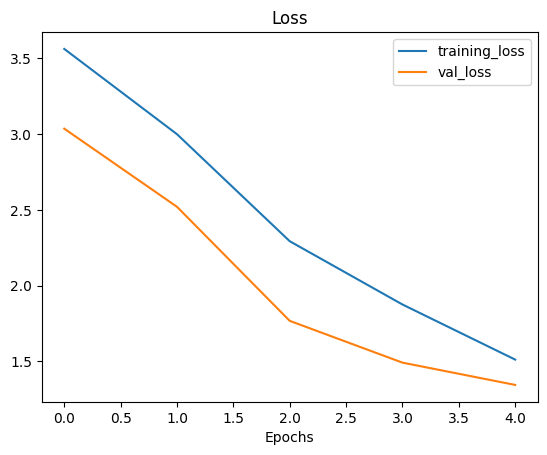

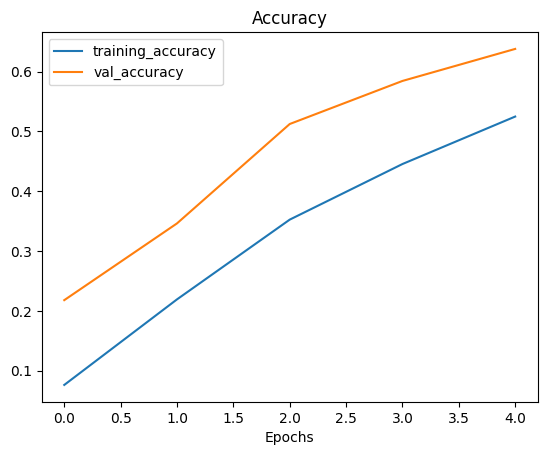

In [55]:
plot_loss_curves(history5)

Epoch 1/10
136/136 ━━━━━━━━━━━━━━━━━━━━ 15s 113ms/step - accuracy: 0.5929 - loss: 1.2024 - val_accuracy: 0.6694 - val_loss: 1.2074
Epoch 2/10
136/136 ━━━━━━━━━━━━━━━━━━━━ 15s 113ms/step - accuracy: 0.5929 - loss: 1.2024 - val_accuracy: 0.6694 - val_loss: 1.2074
Epoch 2/10
136/136 ━━━━━━━━━━━━━━━━━━━━ 18s 132ms/step - accuracy: 0.6407 - loss: 1.0678 - val_accuracy: 0.6879 - val_loss: 1.1538
Epoch 3/10
136/136 ━━━━━━━━━━━━━━━━━━━━ 18s 132ms/step - accuracy: 0.6407 - loss: 1.0678 - val_accuracy: 0.6879 - val_loss: 1.1538
Epoch 3/10
136/136 ━━━━━━━━━━━━━━━━━━━━ 18s 136ms/step - accuracy: 0.6923 - loss: 0.8752 - val_accuracy: 0.6777 - val_loss: 1.1544
Epoch 4/10
136/136 ━━━━━━━━━━━━━━━━━━━━ 18s 136ms/step - accuracy: 0.6923 - loss: 0.8752 - val_accuracy: 0.6777 - val_loss: 1.1544
Epoch 4/10
136/136 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - accuracy: 0.7435 - loss: 0.7109 - val_accuracy: 0.6741 - val_loss: 1.1829
Epoch 5/10
136/136 ━━━━━━━━━━━━━━━━━━━━ 18s 130ms/step - accuracy: 0.7435 - loss: 0

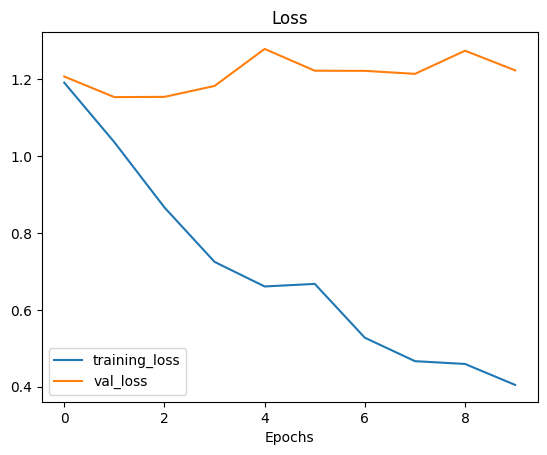

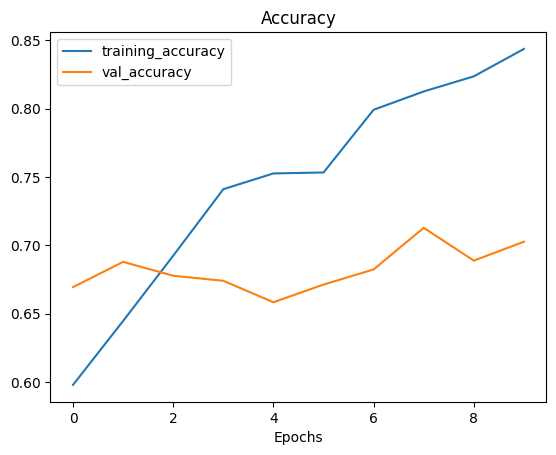

In [56]:
# history6 = model2.fit(
#     train_ds,
#     validation_data=val_ds,
#     epochs=10,
#     class_weight=class_weights
# )
# plot_loss_curves(history6)

# 2. Augmented Data

In [ ]:
walk_through_dir('data_augm/')

There are 5 directories and 0 images in 'data_augm/'.
There are 0 directories and 33 images in 'data_augm/test'.
There are 38 directories and 0 images in 'data_augm/train'.
There are 0 directories and 2016 images in 'data_augm/train\Apple___Apple_scab'.
There are 0 directories and 1987 images in 'data_augm/train\Apple___Black_rot'.
There are 0 directories and 1760 images in 'data_augm/train\Apple___Cedar_apple_rust'.
There are 0 directories and 2008 images in 'data_augm/train\Apple___healthy'.
There are 0 directories and 1816 images in 'data_augm/train\Blueberry___healthy'.
There are 0 directories and 1826 images in 'data_augm/train\Cherry_(including_sour)___healthy'.
There are 0 directories and 1683 images in 'data_augm/train\Cherry_(including_sour)___Powdery_mildew'.
There are 0 directories and 1642 images in 'data_augm/train\Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot'.
There are 0 directories and 1907 images in 'data_augm/train\Corn_(maize)___Common_rust_'.
There are 0 direc

In [ ]:
import tensorflow as tf
from tensorflow.keras import layers, models
import matplotlib.pyplot as plt
import os

## 10%

In [ ]:
import os
import shutil
import random
from tqdm import tqdm

# Original full dataset
src_train_dir = 'data_augm/train'

# New sampled directories
train_10_dir = 'data_augm/train_10'
valid_10_dir = 'data_augm/valid_10'

# Ensure reproducibility
random.seed(42)

# Create output directories
os.makedirs(train_10_dir, exist_ok=True)
os.makedirs(valid_10_dir, exist_ok=True)

# Loop through each class folder
for cls in tqdm(os.listdir(src_train_dir), desc="Sampling and Splitting 10%"):
    src_cls_path = os.path.join(src_train_dir, cls)
    train_10_cls = os.path.join(train_10_dir, cls)
    valid_10_cls = os.path.join(valid_10_dir, cls)

    # Create target subfolders
    os.makedirs(train_10_cls, exist_ok=True)
    os.makedirs(valid_10_cls, exist_ok=True)

    # All images in original class
    images = os.listdir(src_cls_path)
    total = len(images)
    ten_percent_count = int(total * 0.10)

    # Sample 10% from original
    sampled_images = random.sample(images, ten_percent_count)

    # Split into 90/10 of the 10% sample
    split_index = int(len(sampled_images) * 0.90)
    train_images = sampled_images[:split_index]
    valid_images = sampled_images[split_index:]

    # Copy files to respective folders
    for img in train_images:
        shutil.copy2(os.path.join(src_cls_path, img), os.path.join(train_10_cls, img))
    for img in valid_images:
        shutil.copy2(os.path.join(src_cls_path, img), os.path.join(valid_10_cls, img))

print("✅ Done: 10% sample split into train_10 (90%) and valid_10 (10%)")


Sampling and Splitting 10%: 100%|██████████| 38/38 [00:18<00:00,  2.04it/s]

✅ Done: 10% sample split into train_10 (90%) and valid_10 (10%)


In [ ]:
# Setup
train_dir = "data_augm/train_10"
valid_dir = "data_augm/valid_10"
batch_size = 32
img_size = (128, 128)
num_classes = 38  # Total classes in PlantVillage

# 1. Load datasets
train_ds = tf.keras.preprocessing.image_dataset_from_directory(
    train_dir,
    image_size=img_size,
    batch_size=batch_size,
    label_mode='int',
    shuffle=True
)

val_ds = tf.keras.preprocessing.image_dataset_from_directory(
    valid_dir,
    image_size=img_size,
    batch_size=batch_size,
    label_mode='int'
)

Found 6292 files belonging to 38 classes.
Found 721 files belonging to 38 classes.


In [ ]:
# 2. Cache and prefetch for performance
AUTOTUNE = tf.data.AUTOTUNE
train_ds = train_ds.cache().shuffle(1000).prefetch(buffer_size=AUTOTUNE)
val_ds = val_ds.cache().prefetch(buffer_size=AUTOTUNE)

# 3. Define data augmentation
data_augmentation = tf.keras.Sequential([
    layers.RandomFlip("horizontal"),
    layers.RandomRotation(0.1),
    layers.RandomZoom(0.1),
])

In [ ]:
# 4. Define CNN model (lightweight, regularized)
model_aug_10 = models.Sequential([
    layers.Rescaling(1./255, input_shape=img_size + (3,)),
    data_augmentation,

    layers.Conv2D(32, 3, activation='relu'),
    layers.MaxPooling2D(),

    layers.Conv2D(64, 3, activation='relu'),
    layers.MaxPooling2D(),

    layers.Conv2D(128, 3, activation='relu'),
    layers.MaxPooling2D(),

    layers.Flatten(),
    layers.Dense(128, activation='relu'),
    layers.Dropout(0.4),
    layers.Dense(num_classes, activation='softmax')
])

c:\Users\DELL\anaconda3\Lib\site-packages\keras\src\layers\preprocessing\tf_data_layer.py:19: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


In [ ]:
# 5. Compile the model
model_aug_10.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=1e-3),
    loss='sparse_categorical_crossentropy',
    metrics=['accuracy']
)

In [ ]:
# 6. Add early stopping
early_stop = tf.keras.callbacks.EarlyStopping(
    monitor='val_loss',
    patience=3,
    restore_best_weights=True
)

In [ ]:
# 7. Train
history_aug_10 = model_aug_10.fit(
    train_ds,
    validation_data=val_ds,
    epochs=5,
    callbacks=[early_stop]
)

Epoch 1/5
197/197 ━━━━━━━━━━━━━━━━━━━━ 46s 220ms/step - accuracy: 0.0574 - loss: 3.5508 - val_accuracy: 0.1928 - val_loss: 2.9563
Epoch 2/5
197/197 ━━━━━━━━━━━━━━━━━━━━ 41s 209ms/step - accuracy: 0.1869 - loss: 2.9478 - val_accuracy: 0.3315 - val_loss: 2.2826
Epoch 3/5
197/197 ━━━━━━━━━━━━━━━━━━━━ 49s 248ms/step - accuracy: 0.3214 - loss: 2.3777 - val_accuracy: 0.4868 - val_loss: 1.7356
Epoch 4/5
197/197 ━━━━━━━━━━━━━━━━━━━━ 56s 285ms/step - accuracy: 0.3780 - loss: 2.0814 - val_accuracy: 0.5312 - val_loss: 1.5644
Epoch 5/5
197/197 ━━━━━━━━━━━━━━━━━━━━ 48s 241ms/step - accuracy: 0.4322 - loss: 1.8896 - val_accuracy: 0.5770 - val_loss: 1.3578


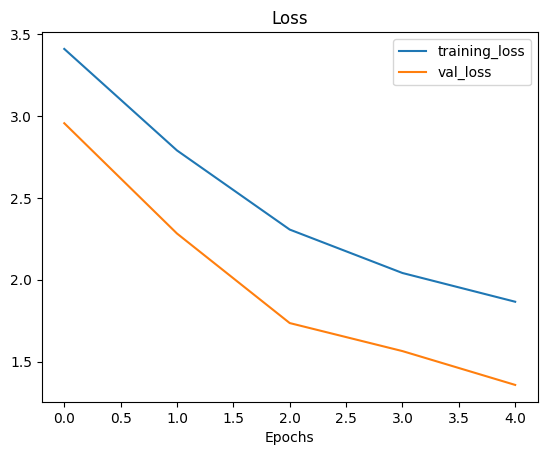

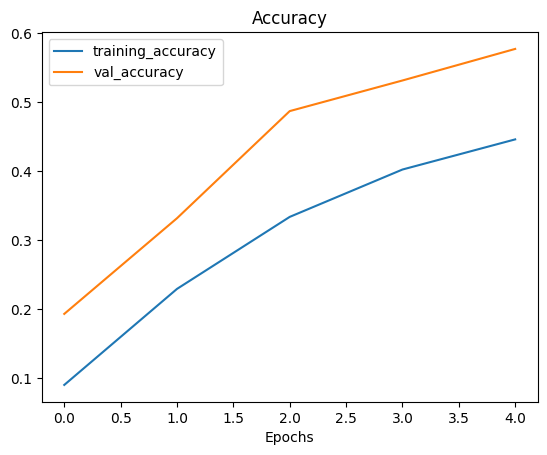

In [ ]:
plot_loss_curves(history_aug_10)

## MobileNet Model 10%

In [ ]:
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D, Dropout
from tensorflow.keras.optimizers import Adam
import os

# Directory paths
train_dir = 'data_augm/train_10'
valid_dir = 'data_augm/valid_10'

# Parameters
img_size = 224
batch_size = 32
epochs = 10  # You can increase this
num_classes = len(os.listdir(train_dir))  # Automatically detects number of folders/classes

# Image Data Generators
train_datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=20,
    zoom_range=0.2,
    horizontal_flip=True
)

valid_datagen = ImageDataGenerator(rescale=1./255)

train_generator = train_datagen.flow_from_directory(
    train_dir,
    target_size=(img_size, img_size),
    batch_size=batch_size,
    class_mode='categorical'
)

valid_generator = valid_datagen.flow_from_directory(
    valid_dir,
    target_size=(img_size, img_size),
    batch_size=batch_size,
    class_mode='categorical'
)

# Load base model without top
base_model = MobileNetV2(weights='imagenet', include_top=False, input_shape=(img_size, img_size, 3))

base_model.trainable = False  # Freeze the base

# Add custom top layers
x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dropout(0.3)(x)
x = Dense(128, activation='relu')(x)
x = Dropout(0.3)(x)
predictions = Dense(num_classes, activation='softmax')(x)

model_mobilenet = Model(inputs=base_model.input, outputs=predictions)

# Compile the model
model_mobilenet.compile(optimizer=Adam(learning_rate=0.0001),
              loss='categorical_crossentropy',
              metrics=['accuracy'])

# Train the model
history_mobilenet = model_mobilenet.fit(
    train_generator,
    validation_data=valid_generator,
    epochs=epochs
)

# Save the model
# model.save('trial_leaf_disease_transfer_model.h5')
# print("✅ Model saved as trial_leaf_disease_transfer_model.h5")


Found 6292 images belonging to 38 classes.
Found 721 images belonging to 38 classes.


✅ Model saved as trial_leaf_disease_transfer_model.h5


In [ ]:
model.evaluate(valid_generator)

23/23 ━━━━━━━━━━━━━━━━━━━━ 8s 306ms/step - accuracy: 0.8499 - loss: 0.6167


[0.6365548968315125, 0.8404992818832397]

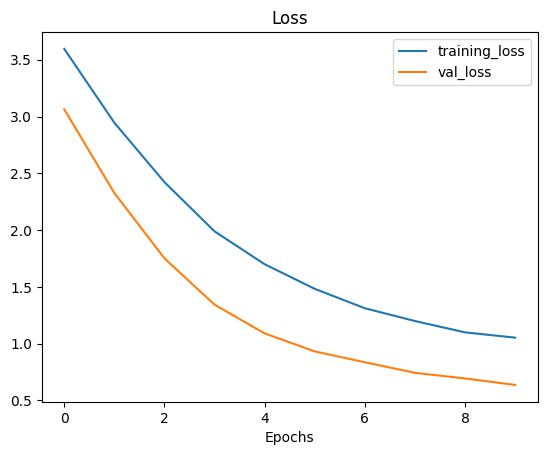

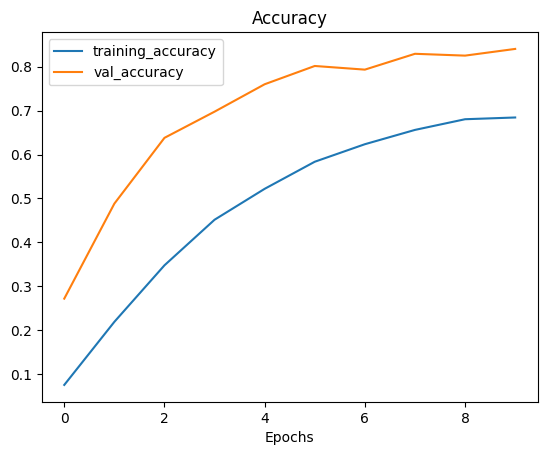

In [ ]:
plot_loss_curves(history_mobilenet)

In [ ]:
#model.summary()

### Trainable model top 10 layers

In [ ]:
for layer in model.layers:
    print(layer, layer.trainable)

<InputLayer name=input_layer_8, built=True> False
<Conv2D name=Conv1, built=True> False
<BatchNormalization name=bn_Conv1, built=True> False
<ReLU name=Conv1_relu, built=True> False
<DepthwiseConv2D name=expanded_conv_depthwise, built=True> False
<BatchNormalization name=expanded_conv_depthwise_BN, built=True> False
<ReLU name=expanded_conv_depthwise_relu, built=True> False
<Conv2D name=expanded_conv_project, built=True> False
<BatchNormalization name=expanded_conv_project_BN, built=True> False
<Conv2D name=block_1_expand, built=True> False
<BatchNormalization name=block_1_expand_BN, built=True> False
<ReLU name=block_1_expand_relu, built=True> False
<ZeroPadding2D name=block_1_pad, built=True> False
<DepthwiseConv2D name=block_1_depthwise, built=True> False
<BatchNormalization name=block_1_depthwise_BN, built=True> False
<ReLU name=block_1_depthwise_relu, built=True> False
<Conv2D name=block_1_project, built=True> False
<BatchNormalization name=block_1_project_BN, built=True> False
<C

In [ ]:
#Trainable = true for top 10 layers
base_model.trainable=True

#freeze all layers except last/top 10
for layer in model.layers[:-10]:
    layer.trainable=False

for layer in base_model.layers[-10:]:
    print(layer.name, layer.trainable)

#Recompile the model (EVERYTIME THE MODEL IS CHANGED)
model.compile(loss="categorical_crossentropy",
                 optimizer=tf.keras.optimizers.Adam(learning_rate=0.0001), #WHEN FINE-TUNING U HAVE TO LOWER THE LEARNING RATE BY 10 X
                 metrics=["accuracy"])

block_16_expand_BN False
block_16_expand_relu False
block_16_depthwise False
block_16_depthwise_BN False
block_16_depthwise_relu False
block_16_project True
block_16_project_BN True
Conv_1 True
Conv_1_bn True
out_relu True


In [ ]:
for layer in model.layers:
    print(layer, layer.trainable)

<InputLayer name=input_layer_8, built=True> False
<Conv2D name=Conv1, built=True> False
<BatchNormalization name=bn_Conv1, built=True> False
<ReLU name=Conv1_relu, built=True> False
<DepthwiseConv2D name=expanded_conv_depthwise, built=True> False
<BatchNormalization name=expanded_conv_depthwise_BN, built=True> False
<ReLU name=expanded_conv_depthwise_relu, built=True> False
<Conv2D name=expanded_conv_project, built=True> False
<BatchNormalization name=expanded_conv_project_BN, built=True> False
<Conv2D name=block_1_expand, built=True> False
<BatchNormalization name=block_1_expand_BN, built=True> False
<ReLU name=block_1_expand_relu, built=True> False
<ZeroPadding2D name=block_1_pad, built=True> False
<DepthwiseConv2D name=block_1_depthwise, built=True> False
<BatchNormalization name=block_1_depthwise_BN, built=True> False
<ReLU name=block_1_depthwise_relu, built=True> False
<Conv2D name=block_1_project, built=True> False
<BatchNormalization name=block_1_project_BN, built=True> False
<C

In [ ]:
history_mobilenet_10_fine = model_mobilenet.fit(
    train_generator,
    validation_data=valid_generator,
    epochs=epochs
)

# # Save the model
# model.save('fine_tune_leaf_disease_transfer_model.h5')
# print("✅ Model saved as fine_tune_leaf_disease_transfer_model.h5")

Epoch 1/10
197/197 ━━━━━━━━━━━━━━━━━━━━ 120s 590ms/step - accuracy: 0.7233 - loss: 0.9374 - val_accuracy: 0.8044 - val_loss: 0.6110
Epoch 2/10
197/197 ━━━━━━━━━━━━━━━━━━━━ 122s 620ms/step - accuracy: 0.8117 - loss: 0.6414 - val_accuracy: 0.8419 - val_loss: 0.5255
Epoch 3/10
197/197 ━━━━━━━━━━━━━━━━━━━━ 123s 623ms/step - accuracy: 0.8362 - loss: 0.5258 - val_accuracy: 0.8225 - val_loss: 0.5437
Epoch 4/10
197/197 ━━━━━━━━━━━━━━━━━━━━ 127s 644ms/step - accuracy: 0.8572 - loss: 0.4413 - val_accuracy: 0.8350 - val_loss: 0.5137
Epoch 5/10
197/197 ━━━━━━━━━━━━━━━━━━━━ 131s 665ms/step - accuracy: 0.8827 - loss: 0.3881 - val_accuracy: 0.8252 - val_loss: 0.6160
Epoch 6/10
197/197 ━━━━━━━━━━━━━━━━━━━━ 137s 697ms/step - accuracy: 0.8913 - loss: 0.3318 - val_accuracy: 0.8405 - val_loss: 0.5194
Epoch 7/10
197/197 ━━━━━━━━━━━━━━━━━━━━ 141s 715ms/step - accuracy: 0.9034 - loss: 0.3062 - val_accuracy: 0.8544 - val_loss: 0.4846
Epoch 8/10
197/197 ━━━━━━━━━━━━━━━━━━━━ 131s 666ms/step - accuracy: 0.9096 -

✅ Model saved as fine_tune_leaf_disease_transfer_model.h5


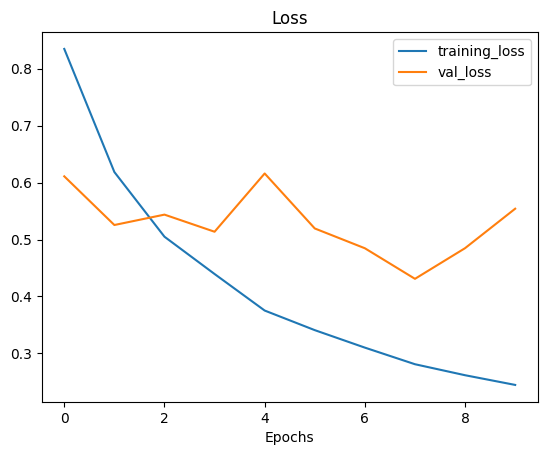

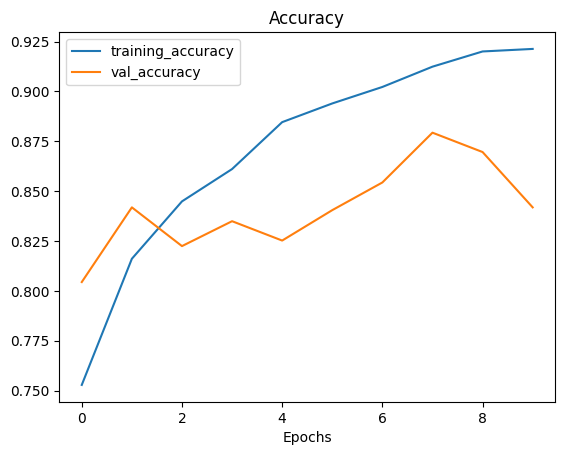

In [ ]:
plot_loss_curves(history_mobilenet_10_fine)

In [ ]:
model.evaluate(valid_generator)

23/23 ━━━━━━━━━━━━━━━━━━━━ 6s 259ms/step - accuracy: 0.8522 - loss: 0.5092


[0.5541176795959473, 0.8418862819671631]

In [ ]:
compare_historys(history_mobilenet, history_mobilenet_10_fine)

## Resnet Model 10%

In [20]:
import tensorflow as tf
from tensorflow.keras import layers, models
from tensorflow.keras.applications import ResNet50
from tensorflow.keras.preprocessing import image_dataset_from_directory
import os

base_model = ResNet50(
    weights='imagenet',
    include_top=False,
    input_shape=IMG_SIZE + (3,)
)
base_model.trainable = False  # Freeze for now

# Model definition
inputs = tf.keras.Input(shape=IMG_SIZE + (3,))
x = data_augmentation(inputs)
x = tf.keras.applications.resnet.preprocess_input(x)
x = base_model(x, training=False)
x = layers.GlobalAveragePooling2D()(x)
x = layers.Dense(256, activation='relu')(x)
x = layers.Dropout(0.5)(x)
outputs = layers.Dense(num_classes, activation='softmax')(x)

model_resnet = tf.keras.Model(inputs, outputs)

# Compile
model_resnet.compile(
    optimizer=tf.keras.optimizers.Adam(1e-4),
    loss='sparse_categorical_crossentropy',
    metrics=['accuracy']
)

# Callbacks
early_stop = tf.keras.callbacks.EarlyStopping(
    monitor='val_loss', patience=3, restore_best_weights=True
)

# Train (feature extraction)
history_resnet = model_resnet.fit(
    train_ds,
    validation_data=val_ds,
    epochs=8,
    callbacks=[early_stop]
)

# Save the model
model.save('resnet50_leaf_disease_model_10_percent.h5')
print("✅ Model saved as resnet50_leaf_disease_model_10_percent.h5")

Epoch 1/8
136/136 ━━━━━━━━━━━━━━━━━━━━ 100s 704ms/step - accuracy: 0.1655 - loss: 3.7354 - val_accuracy: 0.5753 - val_loss: 1.7517
Epoch 2/8
136/136 ━━━━━━━━━━━━━━━━━━━━ 94s 693ms/step - accuracy: 0.4678 - loss: 2.0689 - val_accuracy: 0.6907 - val_loss: 1.1855
Epoch 3/8
136/136 ━━━━━━━━━━━━━━━━━━━━ 89s 652ms/step - accuracy: 0.5875 - loss: 1.5579 - val_accuracy: 0.7525 - val_loss: 0.9082
Epoch 4/8
136/136 ━━━━━━━━━━━━━━━━━━━━ 87s 638ms/step - accuracy: 0.6582 - loss: 1.2673 - val_accuracy: 0.7922 - val_loss: 0.7501
Epoch 5/8
136/136 ━━━━━━━━━━━━━━━━━━━━ 90s 659ms/step - accuracy: 0.7114 - loss: 1.0706 - val_accuracy: 0.8190 - val_loss: 0.6462
Epoch 6/8
136/136 ━━━━━━━━━━━━━━━━━━━━ 95s 697ms/step - accuracy: 0.7385 - loss: 0.9217 - val_accuracy: 0.8347 - val_loss: 0.5887
Epoch 7/8
136/136 ━━━━━━━━━━━━━━━━━━━━ 110s 812ms/step - accuracy: 0.7659 - loss: 0.8145 - val_accuracy: 0.8403 - val_loss: 0.5444
Epoch 8/8
136/136 ━━━━━━━━━━━━━━━━━━━━ 89s 653ms/step - accuracy: 0.8050 - loss: 0.7153 

✅ Model saved as resnet50_leaf_disease_model_10_percent.h5


In [29]:
model.evaluate(val_ds)

34/34 ━━━━━━━━━━━━━━━━━━━━ 13s 374ms/step - accuracy: 0.8580 - loss: 0.4857
34/34 ━━━━━━━━━━━━━━━━━━━━ 13s 374ms/step - accuracy: 0.8580 - loss: 0.4857


[0.5160003304481506, 0.8457987308502197]

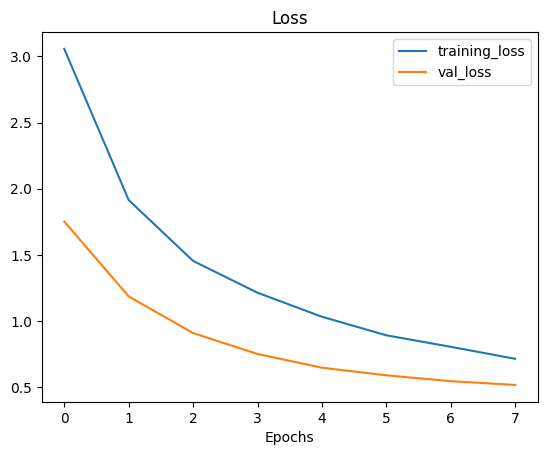

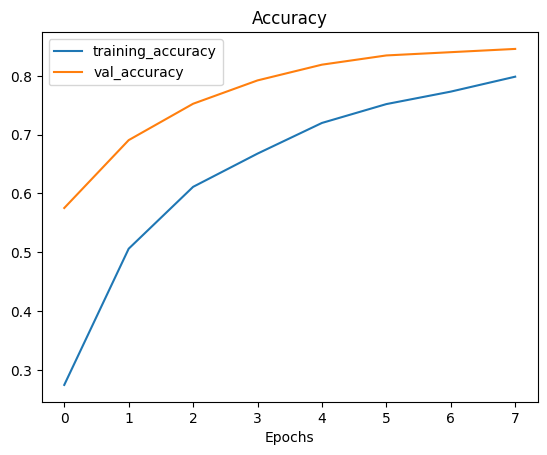

In [21]:
plot_loss_curves(history_resnet)

### Resnet Fine Tuned

In [70]:
base_model.trainable = True  

for layer in base_model.layers[:-10]:
    layer.trainable = False


In [71]:
for layer in model_resnet.layers:
    print(layer.name, layer, layer.trainable)

input_layer_7 <InputLayer name=input_layer_7, built=True> True
sequential_2 <Sequential name=sequential_2, built=True> True
resnet50 <Functional name=resnet50, built=True> True
global_average_pooling2d_2 <GlobalAveragePooling2D name=global_average_pooling2d_2, built=True> True
dense_10 <Dense name=dense_10, built=True> True
dropout_7 <Dropout name=dropout_7, built=True> True
dense_11 <Dense name=dense_11, built=True> True


In [72]:
model_resnet.compile(
    optimizer=tf.keras.optimizers.Adam(1e-5),  # Lower learning rate for fine-tuning
    loss='sparse_categorical_crossentropy',
    metrics=['accuracy']
)

In [73]:
history_resnet_fine = model_resnet.fit(
    train_ds,
    validation_data=val_ds,
    epochs=7,
    callbacks=[early_stop]
)

Epoch 1/7
197/197 ━━━━━━━━━━━━━━━━━━━━ 144s 707ms/step - accuracy: 0.8157 - loss: 0.6368 - val_accuracy: 0.8544 - val_loss: 0.4470
Epoch 2/7
197/197 ━━━━━━━━━━━━━━━━━━━━ 163s 830ms/step - accuracy: 0.8274 - loss: 0.5828 - val_accuracy: 0.8599 - val_loss: 0.4341
Epoch 3/7
197/197 ━━━━━━━━━━━━━━━━━━━━ 154s 784ms/step - accuracy: 0.8420 - loss: 0.5404 - val_accuracy: 0.8655 - val_loss: 0.4179
Epoch 4/7
197/197 ━━━━━━━━━━━━━━━━━━━━ 152s 772ms/step - accuracy: 0.8496 - loss: 0.5077 - val_accuracy: 0.8669 - val_loss: 0.4071
Epoch 5/7
197/197 ━━━━━━━━━━━━━━━━━━━━ 147s 749ms/step - accuracy: 0.8469 - loss: 0.4784 - val_accuracy: 0.8682 - val_loss: 0.3843
Epoch 6/7
197/197 ━━━━━━━━━━━━━━━━━━━━ 155s 788ms/step - accuracy: 0.8550 - loss: 0.4775 - val_accuracy: 0.8682 - val_loss: 0.3827
Epoch 7/7
197/197 ━━━━━━━━━━━━━━━━━━━━ 150s 764ms/step - accuracy: 0.8709 - loss: 0.4429 - val_accuracy: 0.8807 - val_loss: 0.3666


In [76]:
model_resnet.evaluate(val_ds)

23/23 ━━━━━━━━━━━━━━━━━━━━ 6s 279ms/step - accuracy: 0.8870 - loss: 0.3640


[0.366573691368103, 0.8807212114334106]

In [ ]:
model_resnet.save('fine_tune_10%_resnet50.h5')

# from tensorflow.keras.models import load_model
# model = load_model('plant_disease_resnet50.h5')

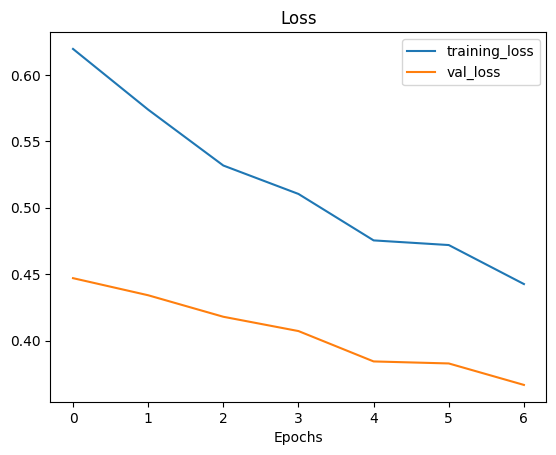

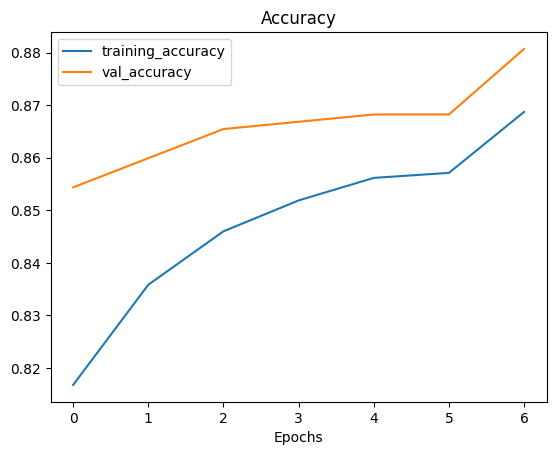

In [ ]:
plot_loss_curves(history_resnet_fine)

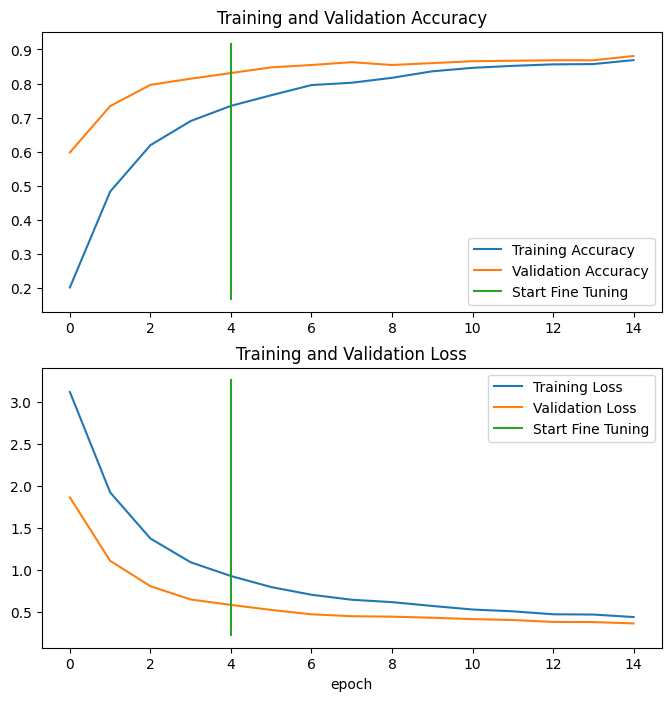

In [75]:
compare_historys(history_resnet, history_resnet_fine)

In [84]:
from tensorflow.keras.utils import load_img, img_to_array
import numpy as np
import os

test_dir = "data_augm/test"
image_paths = [os.path.join(test_dir, fname) for fname in os.listdir(test_dir) if fname.lower().endswith(('.jpg', '.png'))]

for path in image_paths:
    img = load_img(path, target_size=(128, 128))
    img_array = img_to_array(img)
    img_array = tf.keras.applications.resnet50.preprocess_input(img_array)
    img_array = np.expand_dims(img_array, axis=0)

    preds = model_resnet.predict(img_array)
    # predicted_class = class_names[np.argmax(preds)]  # if you have class_names list
    # print(f"{os.path.basename(path)} → {predicted_class}")


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━

In [96]:
from tensorflow.keras.preprocessing import image_dataset_from_directory

# Load dataset WITHOUT any chaining like .cache() or .prefetch()
ds_for_classnames = image_dataset_from_directory(
    "data_augm/train",              # your training directory
    image_size=(224, 224),
    batch_size=32,
    label_mode='int',
    shuffle=False                  # Important: don't shuffle for class label consistency
)

# Now retrieve class names
class_names = ds_for_classnames.class_names
print("Class names:", class_names)


Found 70295 files belonging to 38 classes.
Class names: ['Apple___Apple_scab', 'Apple___Black_rot', 'Apple___Cedar_apple_rust', 'Apple___healthy', 'Blueberry___healthy', 'Cherry_(including_sour)___Powdery_mildew', 'Cherry_(including_sour)___healthy', 'Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot', 'Corn_(maize)___Common_rust_', 'Corn_(maize)___Northern_Leaf_Blight', 'Corn_(maize)___healthy', 'Grape___Black_rot', 'Grape___Esca_(Black_Measles)', 'Grape___Leaf_blight_(Isariopsis_Leaf_Spot)', 'Grape___healthy', 'Orange___Haunglongbing_(Citrus_greening)', 'Peach___Bacterial_spot', 'Peach___healthy', 'Pepper,_bell___Bacterial_spot', 'Pepper,_bell___healthy', 'Potato___Early_blight', 'Potato___Late_blight', 'Potato___healthy', 'Raspberry___healthy', 'Soybean___healthy', 'Squash___Powdery_mildew', 'Strawberry___Leaf_scorch', 'Strawberry___healthy', 'Tomato___Bacterial_spot', 'Tomato___Early_blight', 'Tomato___Late_blight', 'Tomato___Leaf_Mold', 'Tomato___Septoria_leaf_spot', 'Tomato___Sp

In [ ]:
# predicted_index = np.argmax(pred)
# predicted_class = class_names[predicted_index]


NameError: name 'pred' is not defined

In [102]:
with open("class_names.txt", "w") as f:
    for name in class_names:
        f.write(name + "\n")


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
AppleCedarRust1.JPG → Apple___Cedar_apple_rust


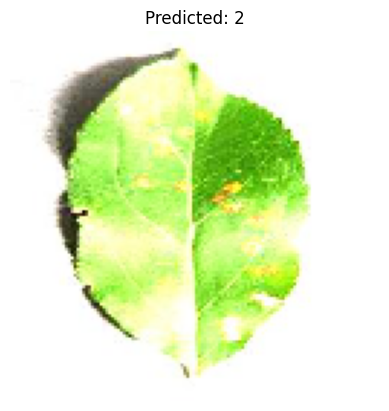

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step
AppleCedarRust2.JPG → Apple___Cedar_apple_rust


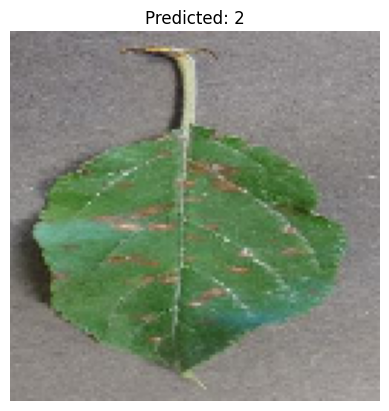

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
AppleCedarRust3.JPG → Tomato___Late_blight


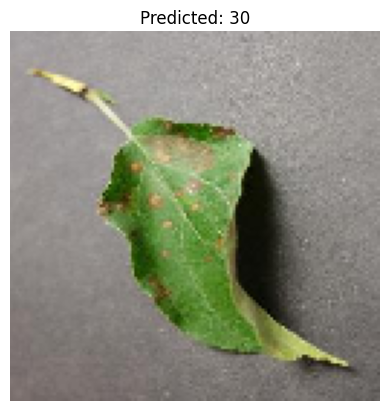

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
AppleCedarRust4.JPG → Tomato___Late_blight


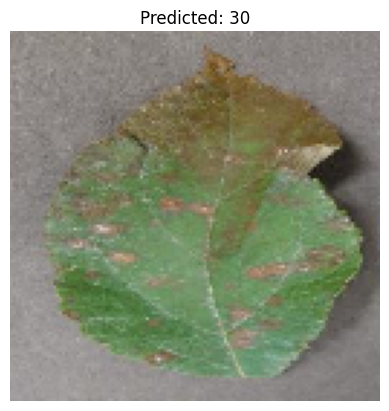

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
AppleScab1.JPG → Apple___Apple_scab


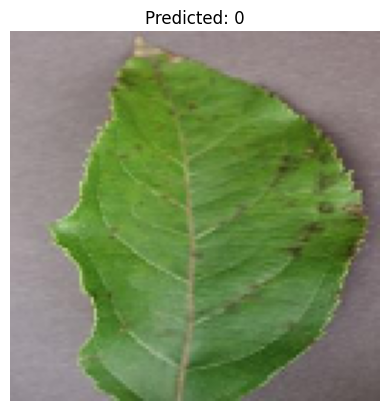

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step
AppleScab2.JPG → Apple___Apple_scab


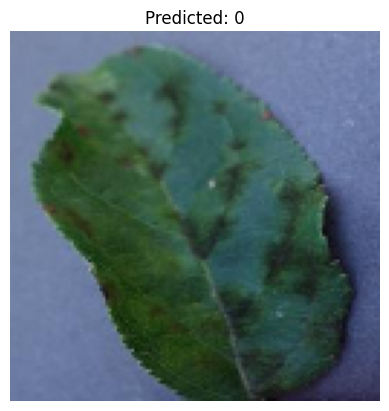

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
AppleScab3.JPG → Corn_(maize)___Common_rust_


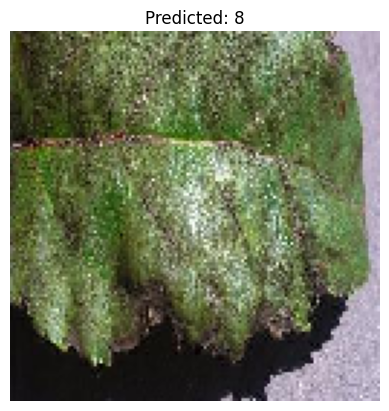

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
CornCommonRust1.JPG → Corn_(maize)___Common_rust_


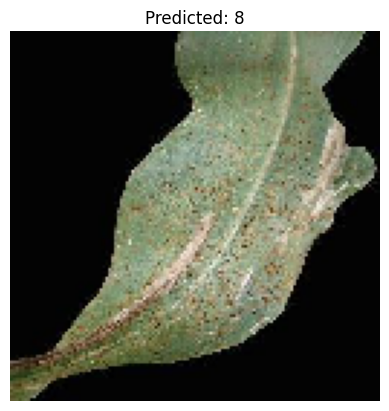

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
CornCommonRust2.JPG → Corn_(maize)___Common_rust_


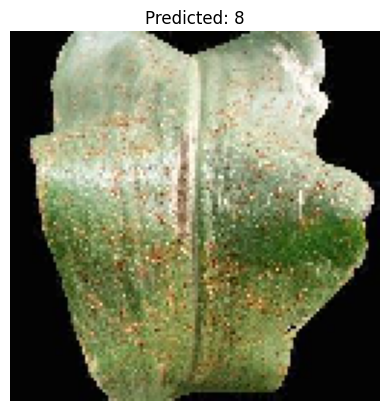

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
CornCommonRust3.JPG → Corn_(maize)___Common_rust_


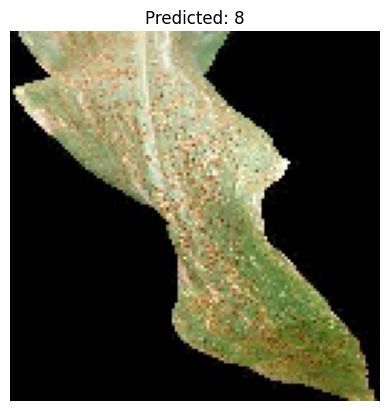

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
PotatoEarlyBlight1.JPG → Potato___Early_blight


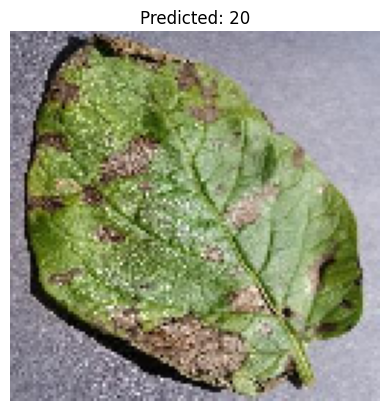

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
PotatoEarlyBlight2.JPG → Apple___Black_rot


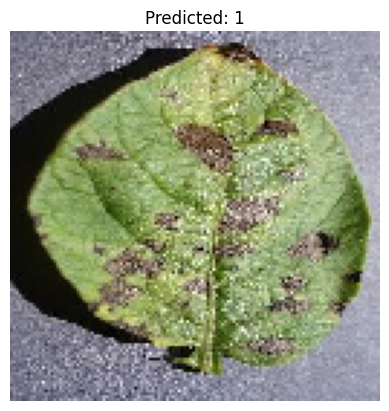

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
PotatoEarlyBlight3.JPG → Apple___healthy


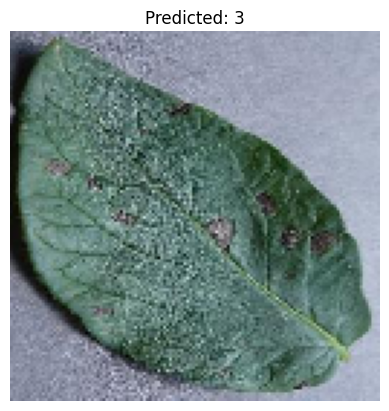

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step
PotatoEarlyBlight4.JPG → Potato___Early_blight


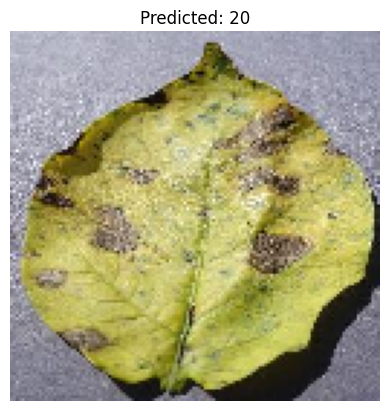

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
PotatoEarlyBlight5.JPG → Apple___Black_rot


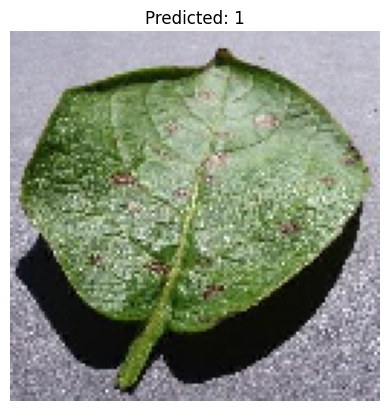

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step
PotatoHealthy1.JPG → Potato___healthy


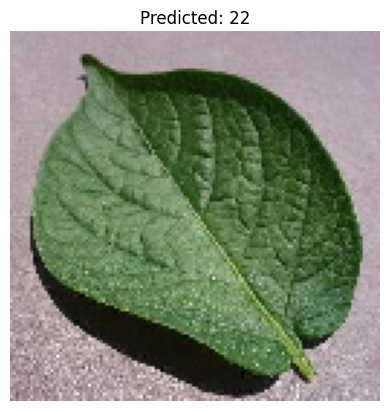

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
PotatoHealthy2.JPG → Potato___healthy


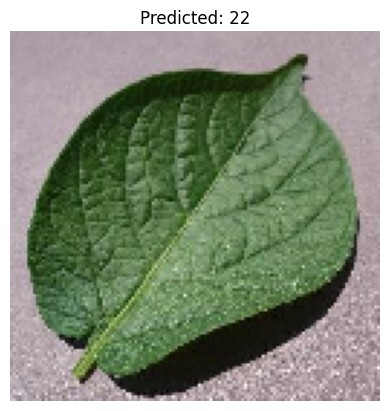

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
TomatoEarlyBlight1.JPG → Tomato___Early_blight


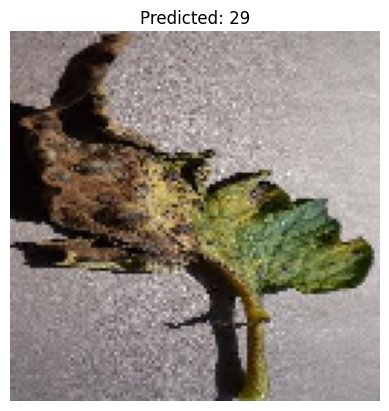

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step
TomatoEarlyBlight2.JPG → Tomato___Late_blight


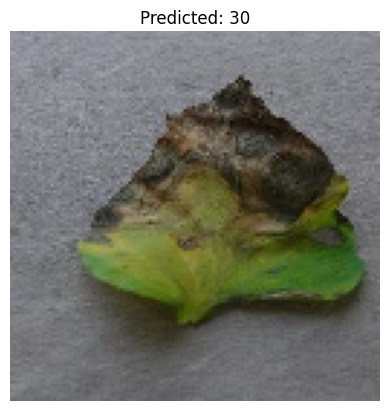

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step
TomatoEarlyBlight3.JPG → Grape___Esca_(Black_Measles)


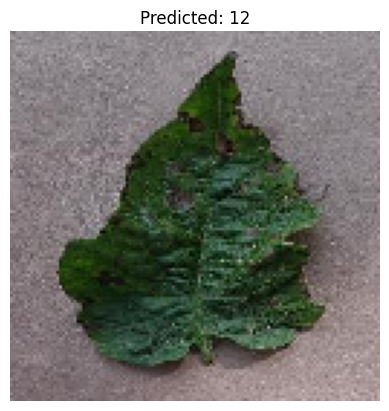

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
TomatoEarlyBlight4.JPG → Grape___Esca_(Black_Measles)


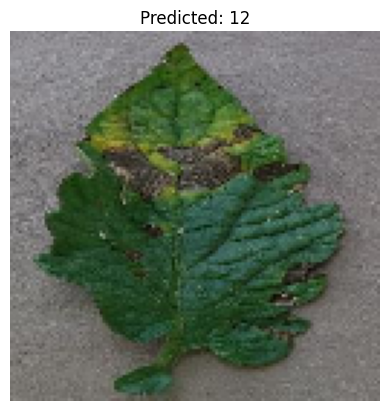

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
TomatoEarlyBlight5.JPG → Tomato___healthy


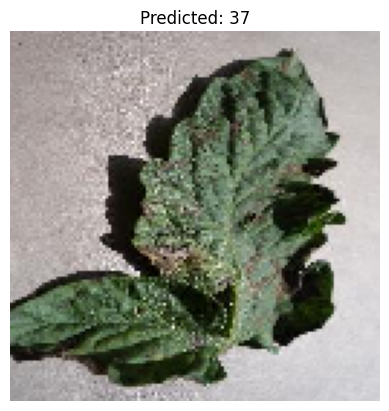

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step
TomatoEarlyBlight6.JPG → Tomato___healthy


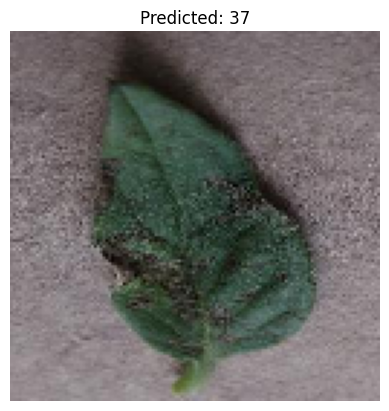

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
TomatoHealthy1.JPG → Tomato___healthy


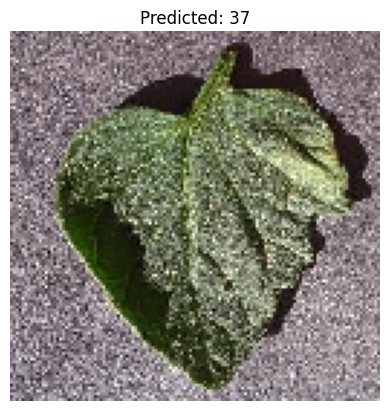

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
TomatoHealthy2.JPG → Potato___healthy


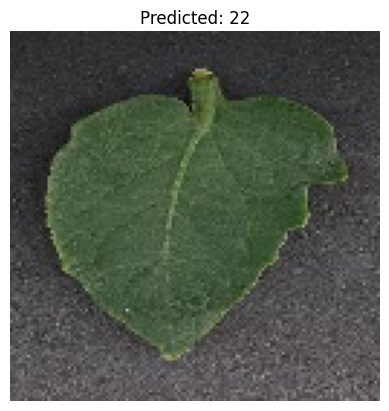

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
TomatoHealthy3.JPG → Tomato___healthy


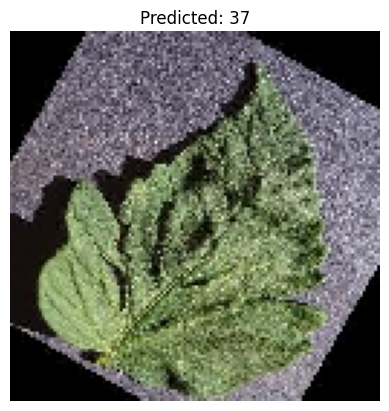

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
TomatoHealthy4.JPG → Tomato___healthy


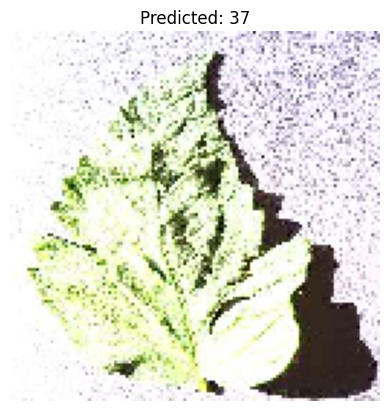

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
TomatoYellowCurlVirus1.JPG → Grape___Esca_(Black_Measles)


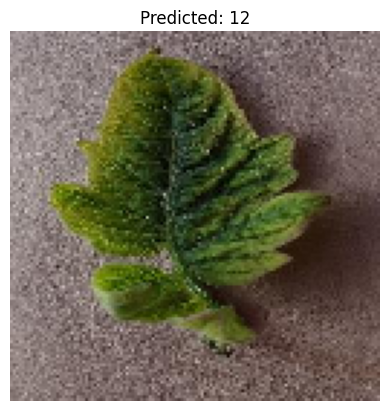

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
TomatoYellowCurlVirus2.JPG → Tomato___Tomato_Yellow_Leaf_Curl_Virus


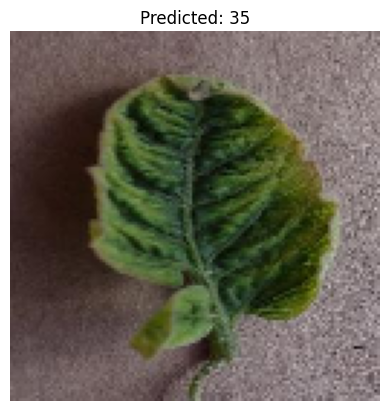

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
TomatoYellowCurlVirus3.JPG → Tomato___Tomato_Yellow_Leaf_Curl_Virus


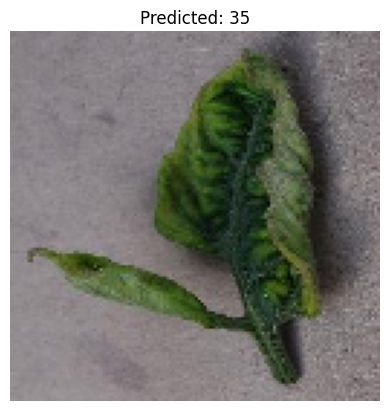

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
TomatoYellowCurlVirus4.JPG → Tomato___Late_blight


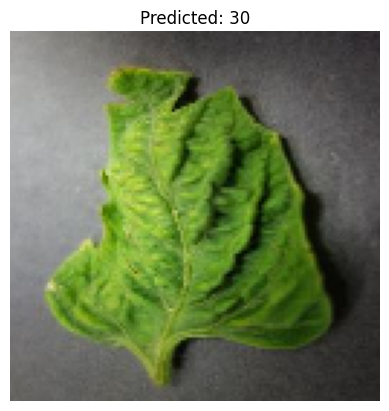

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
TomatoYellowCurlVirus5.JPG → Tomato___Early_blight


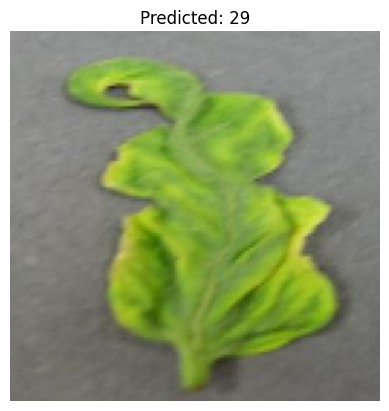

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
TomatoYellowCurlVirus6.JPG → Tomato___Tomato_Yellow_Leaf_Curl_Virus


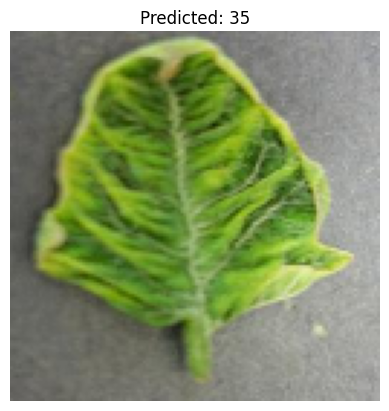

In [100]:
# display predicted image
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing.image import load_img, img_to_array
test_dir = "data_augm/test"
image_paths = [os.path.join(test_dir, fname) for fname in os.listdir(test_dir) if fname.lower().endswith(('.jpg', '.png'))]
for path in image_paths:
    img = load_img(path, target_size=(128, 128))
    img_array = img_to_array(img)
    img_array = tf.keras.applications.resnet50.preprocess_input(img_array)
    img_array = np.expand_dims(img_array, axis=0)

    preds = model_resnet.predict(img_array)
    predicted_index = np.argmax(preds)
    predicted_class = class_names[predicted_index]

    # class_names = train_ds.class_names
    # print(class_names)

    predicted_class = class_names[np.argmax(preds)]  # if you have class_names list
    print(f"{os.path.basename(path)} → {predicted_class}")
    plt.imshow(img)
    plt.title(f"Predicted: {np.argmax(preds)}")
    plt.axis('off')
    plt.show()
    


### User Prediction

In [113]:
import tensorflow as tf
import numpy as np
from tensorflow.keras.preprocessing import image
import os

def predict_disease(image_path, model, class_names):
    """
    Predicts the plant disease class for a given image path.

    Parameters:
    - image_path: str, path to the image
    - model: loaded Keras model
    - class_names: list of class labels in order

    Returns:
    - predicted_class: str, name of the predicted class
    - confidence: float, prediction probability (0–1)
    """
    if not os.path.exists(image_path):
        raise FileNotFoundError(f"Image not found: {image_path}")

    img = tf.keras.utils.load_img(image_path, target_size=(128, 128))
    img_array = tf.keras.utils.img_to_array(img)
    img_array = tf.keras.applications.resnet50.preprocess_input(img_array)
    img_array = np.expand_dims(img_array, axis=0)  # Shape: (1, 224, 224, 3)

    predictions = model.predict(img_array)
    predicted_index = np.argmax(predictions[0])
    confidence = float(np.max(predictions[0]))

    predicted_class = class_names[predicted_index]

    return predicted_class, confidence


In [119]:
# Load model (if not already loaded)
# model = tf.keras.models.load_model("fine_tune_10%_resnet50.h5")

# Load class names
with open("class_names.txt", "r") as f:
    class_names = [line.strip() for line in f]

# Predict

img_path = 'data_augm\sample_test_images\health_blueb.JPG'
predicted_class, confidence = predict_disease(img_path, model_resnet, class_names)

print(f"Prediction: {predicted_class}")
print(f"Confidence: {confidence:.2f}")


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
Prediction: Blueberry___healthy
Confidence: 0.69


## 20% Data

In [2]:
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing import image


In [7]:
import os
import shutil
from sklearn.model_selection import train_test_split

source_train_dir = "data_augm/train"
target_train20_dir = "train20b"

def create_train50_split():
    if os.path.exists(target_train20_dir):
        shutil.rmtree(target_train20_dir)
    os.makedirs(target_train20_dir, exist_ok=True)

    for class_name in os.listdir(source_train_dir):
        class_path = os.path.join(source_train_dir, class_name)
        if not os.path.isdir(class_path):
            continue

        images = os.listdir(class_path)
        images = [img for img in images if img.lower().endswith((".jpg", ".jpeg", ".png"))]

        # Split to 50%
        train_half, _ = train_test_split(images, test_size=0.8, random_state=42)

        # Create class folder in train50
        class_target_path = os.path.join(target_train20_dir, class_name)
        os.makedirs(class_target_path, exist_ok=True)

        for img in train_half:
            shutil.copy(os.path.join(class_path, img), os.path.join(class_target_path, img))

    print("✅ 20% training data created in 'train50/' from 'data_augm/train/'.")

create_train50_split()


✅ 20% training data created in 'train50/' from 'data_augm/train/'.


In [9]:
#for vlaidation data split

source_train_dir = "data_augm/valid"
target_train20_dir = "valid20b"

def create_train50_split():
    if os.path.exists(target_train20_dir):
        shutil.rmtree(target_train20_dir)
    os.makedirs(target_train20_dir, exist_ok=True)

    for class_name in os.listdir(source_train_dir):
        class_path = os.path.join(source_train_dir, class_name)
        if not os.path.isdir(class_path):
            continue

        images = os.listdir(class_path)
        images = [img for img in images if img.lower().endswith((".jpg", ".jpeg", ".png"))]

        # Split to 50%
        train_half, _ = train_test_split(images, test_size=0.75, random_state=42)

        # Create class folder in train50
        class_target_path = os.path.join(target_train20_dir, class_name)
        os.makedirs(class_target_path, exist_ok=True)

        for img in train_half:
            shutil.copy(os.path.join(class_path, img), os.path.join(class_target_path, img))

    print("✅ 20% training data created in 'train50/' from 'data_augm/train/'.")

create_train50_split()

✅ 20% training data created in 'train50/' from 'data_augm/train/'.


In [10]:
train_ds = tf.keras.preprocessing.image_dataset_from_directory(
    "train20b", image_size=(224, 224), batch_size=32)

val_ds = tf.keras.preprocessing.image_dataset_from_directory(
    "valid20b", image_size=(224, 224), batch_size=32)


Found 14044 files belonging to 38 classes.
Found 4382 files belonging to 38 classes.


In [ ]:
# To read class names from file into a variable
with open("class_names.txt", "r") as f:
    class_names = [line.strip() for line in f]

print("Class names loaded from file:", class_names)
len(class_names)  

Class names loaded from file: ['Apple___Apple_scab', 'Apple___Black_rot', 'Apple___Cedar_apple_rust', 'Apple___healthy', 'Blueberry___healthy', 'Cherry_(including_sour)___Powdery_mildew', 'Cherry_(including_sour)___healthy', 'Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot', 'Corn_(maize)___Common_rust_', 'Corn_(maize)___Northern_Leaf_Blight', 'Corn_(maize)___healthy', 'Grape___Black_rot', 'Grape___Esca_(Black_Measles)', 'Grape___Leaf_blight_(Isariopsis_Leaf_Spot)', 'Grape___healthy', 'Orange___Haunglongbing_(Citrus_greening)', 'Peach___Bacterial_spot', 'Peach___healthy', 'Pepper,_bell___Bacterial_spot', 'Pepper,_bell___healthy', 'Potato___Early_blight', 'Potato___Late_blight', 'Potato___healthy', 'Raspberry___healthy', 'Soybean___healthy', 'Squash___Powdery_mildew', 'Strawberry___Leaf_scorch', 'Strawberry___healthy', 'Tomato___Bacterial_spot', 'Tomato___Early_blight', 'Tomato___Late_blight', 'Tomato___Leaf_Mold', 'Tomato___Septoria_leaf_spot', 'Tomato___Spider_mites Two-spotted_spi

38

In [16]:
import tensorflow as tf
from tensorflow.keras.applications import ResNet50
from tensorflow.keras.layers import GlobalAveragePooling2D, Dense, Dropout
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau, ModelCheckpoint

# Load datasets
img_size = (224, 224)
batch_size = 32

num_classes = len(class_names)

AUTOTUNE = tf.data.AUTOTUNE
train_ds = train_ds.cache().shuffle(1000).prefetch(buffer_size=AUTOTUNE)
val_ds = val_ds.cache().prefetch(buffer_size=AUTOTUNE)

# Build base model
base_model = ResNet50(weights='imagenet', include_top=False, input_shape=(224, 224, 3))
base_model.trainable = False  # Freeze initially

# Custom head
x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dropout(0.5)(x)
x = Dense(256, activation='relu')(x)
x = Dropout(0.3)(x)
outputs = Dense(num_classes, activation='softmax')(x)

model_resnet_50 = Model(inputs=base_model.input, outputs=outputs)

# Compile for feature extraction stage
model_resnet_50.compile(optimizer=Adam(1e-4),
              loss='sparse_categorical_crossentropy',
              metrics=['accuracy'])

# Callbacks
early_stop = EarlyStopping(monitor='val_loss', patience=4, restore_best_weights=True)
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=2)
model_ckpt = ModelCheckpoint("best_model.keras", save_best_only=True, monitor='val_loss')

# Train (Stage 1: Freeze Base)
history_50_percent_resnet = model_resnet_50.fit(train_ds,
                     epochs=5,
                     validation_data=val_ds,
                     callbacks=[early_stop, reduce_lr, model_ckpt])

# Stage 2: Fine-tune top 50 layers
base_model.trainable = True
for layer in base_model.layers[:-25]:  # Freeze all but the last 25 layers
    layer.trainable = False

# Recompile with lower LR
model_resnet_50.compile(optimizer=Adam(1e-5),
              loss='sparse_categorical_crossentropy',
              metrics=['accuracy'])

# Fine-tune
history_50_percent_resnet_fine = model_resnet_50.fit(train_ds,
                     epochs=6,
                     validation_data=val_ds,
                     callbacks=[early_stop, reduce_lr, model_ckpt])


Epoch 1/5
439/439 ━━━━━━━━━━━━━━━━━━━━ 1049s 2s/step - accuracy: 0.1435 - loss: 3.5602 - val_accuracy: 0.7629 - val_loss: 1.2410 - learning_rate: 1.0000e-04
Epoch 2/5
439/439 ━━━━━━━━━━━━━━━━━━━━ 949s 2s/step - accuracy: 0.5333 - loss: 1.6255 - val_accuracy: 0.8617 - val_loss: 0.5895 - learning_rate: 1.0000e-04
Epoch 3/5
439/439 ━━━━━━━━━━━━━━━━━━━━ 1049s 2s/step - accuracy: 0.6858 - loss: 1.0350 - val_accuracy: 0.8925 - val_loss: 0.4123 - learning_rate: 1.0000e-04
Epoch 4/5
439/439 ━━━━━━━━━━━━━━━━━━━━ 1066s 2s/step - accuracy: 0.7557 - loss: 0.7869 - val_accuracy: 0.9110 - val_loss: 0.3347 - learning_rate: 1.0000e-04
Epoch 5/5
439/439 ━━━━━━━━━━━━━━━━━━━━ 929s 2s/step - accuracy: 0.7952 - loss: 0.6704 - val_accuracy: 0.9188 - val_loss: 0.2896 - learning_rate: 1.0000e-04
Epoch 1/6
439/439 ━━━━━━━━━━━━━━━━━━━━ 1067s 2s/step - accuracy: 0.7927 - loss: 0.6840 - val_accuracy: 0.9375 - val_loss: 0.2259 - learning_rate: 1.0000e-05
Epoch 2/6
439/439 ━━━━━━━━━━━━━━━━━━━━ 1055s 2s/step - accur

In [18]:
model_resnet_50.save('dhruv_resnet_20.h5')

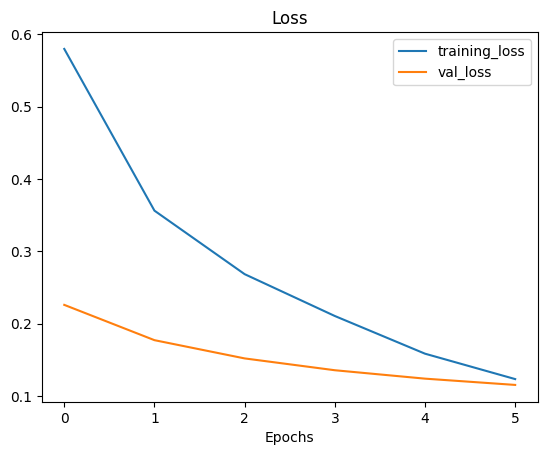

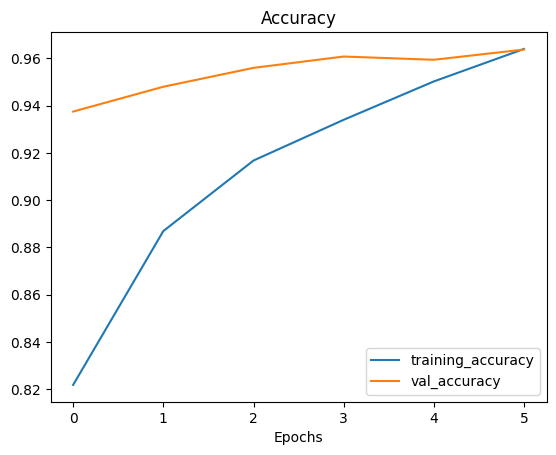

In [20]:
from helper_functions import plot_loss_curves, compare_historys
plot_loss_curves(history_50_percent_resnet_fine)

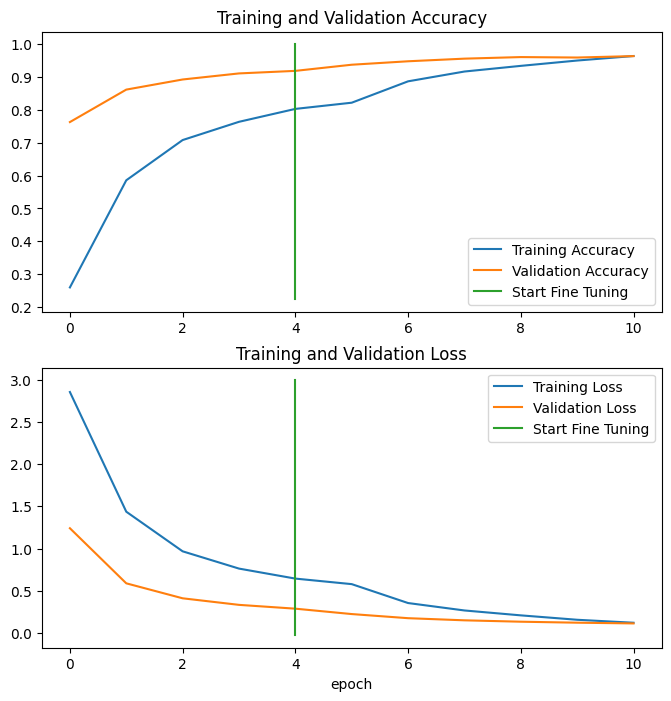

In [21]:
compare_historys(history_50_percent_resnet, history_50_percent_resnet_fine)

In [ ]:
model_resnet_50.evaluate(val_ds)

## 50% 

In [24]:
train_ds = tf.keras.preprocessing.image_dataset_from_directory(
    "train50", image_size=(128, 128), batch_size=32)

val_ds = tf.keras.preprocessing.image_dataset_from_directory(
    "data_augm/valid", image_size=(128, 128), batch_size=32)

Found 35141 files belonging to 38 classes.
Found 17572 files belonging to 38 classes.


In [25]:
import tensorflow as tf
from tensorflow.keras.applications import ResNet50
from tensorflow.keras.layers import GlobalAveragePooling2D, Dense, Dropout
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau, ModelCheckpoint

# Load datasets
img_size = (128, 128)
batch_size = 32

num_classes = len(class_names)

AUTOTUNE = tf.data.AUTOTUNE
train_ds = train_ds.cache().shuffle(1000).prefetch(buffer_size=AUTOTUNE)
val_ds = val_ds.cache().prefetch(buffer_size=AUTOTUNE)

# Build base model
base_model = ResNet50(weights='imagenet', include_top=False, input_shape=(128, 128, 3))
base_model.trainable = False  # Freeze initially

# Custom head
x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dropout(0.5)(x)
x = Dense(256, activation='relu')(x)
x = Dropout(0.3)(x)
outputs = Dense(num_classes, activation='softmax')(x)

model_resnet_50_per = Model(inputs=base_model.input, outputs=outputs)

# Compile for feature extraction stage
model_resnet_50_per.compile(optimizer=Adam(1e-4),
              loss='sparse_categorical_crossentropy',
              metrics=['accuracy'])

# Callbacks
early_stop = EarlyStopping(monitor='val_loss', patience=4, restore_best_weights=True)
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=2)
model_ckpt = ModelCheckpoint("best_model.keras", save_best_only=True, monitor='val_loss')

# Train (Stage 1: Freeze Base)
history_50b_percent_resnet = model_resnet_50_per.fit(train_ds,
                     epochs=5,
                     validation_data=val_ds,
                     callbacks=[early_stop, reduce_lr, model_ckpt])

# Stage 2: Fine-tune top 50 layers
base_model.trainable = True
for layer in base_model.layers[:-25]:  # Freeze all but the last 25 layers
    layer.trainable = False

# Recompile with lower LR
model_resnet_50_per.compile(optimizer=Adam(1e-5),
              loss='sparse_categorical_crossentropy',
              metrics=['accuracy'])

# Fine-tune
history_50b_percent_resnet_fine = model_resnet_50_per.fit(train_ds,
                     epochs=6,
                     validation_data=val_ds,
                     callbacks=[early_stop, reduce_lr, model_ckpt])


Epoch 1/5
1099/1099 ━━━━━━━━━━━━━━━━━━━━ 851s 765ms/step - accuracy: 0.2447 - loss: 3.1170 - val_accuracy: 0.8136 - val_loss: 0.7079 - learning_rate: 1.0000e-04
Epoch 2/5
1099/1099 ━━━━━━━━━━━━━━━━━━━━ 816s 742ms/step - accuracy: 0.6580 - loss: 1.1141 - val_accuracy: 0.8744 - val_loss: 0.4334 - learning_rate: 1.0000e-04
Epoch 3/5
1099/1099 ━━━━━━━━━━━━━━━━━━━━ 802s 730ms/step - accuracy: 0.7541 - loss: 0.7831 - val_accuracy: 0.8943 - val_loss: 0.3496 - learning_rate: 1.0000e-04
Epoch 4/5
1099/1099 ━━━━━━━━━━━━━━━━━━━━ 801s 729ms/step - accuracy: 0.7979 - loss: 0.6384 - val_accuracy: 0.9103 - val_loss: 0.2948 - learning_rate: 1.0000e-04
Epoch 5/5
1099/1099 ━━━━━━━━━━━━━━━━━━━━ 808s 736ms/step - accuracy: 0.8204 - loss: 0.5589 - val_accuracy: 0.9189 - val_loss: 0.2647 - learning_rate: 1.0000e-04
Epoch 1/6
1099/1099 ━━━━━━━━━━━━━━━━━━━━ 1044s 944ms/step - accuracy: 0.7939 - loss: 0.6739 - val_accuracy: 0.9277 - val_loss: 0.2302 - learning_rate: 1.0000e-05
Epoch 2/6
1099/1099 ━━━━━━━━━━━━━

In [26]:
model_resnet_50_per.save('dhruv_resnet_50.h5')

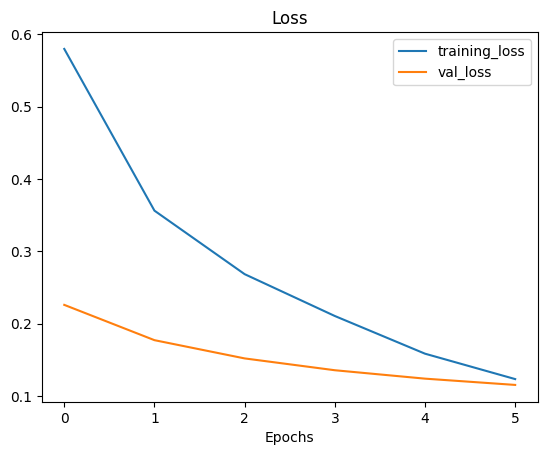

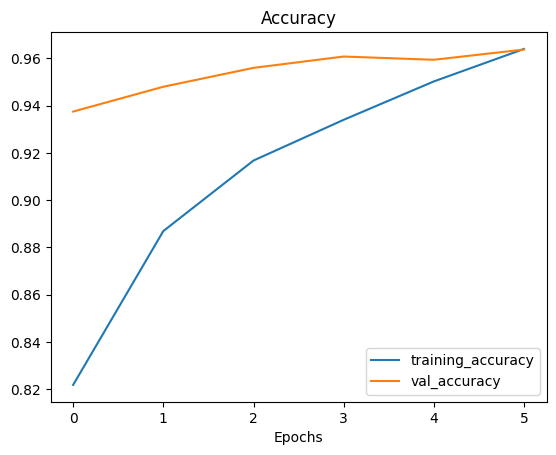

In [27]:
plot_loss_curves(history_50_percent_resnet_fine)

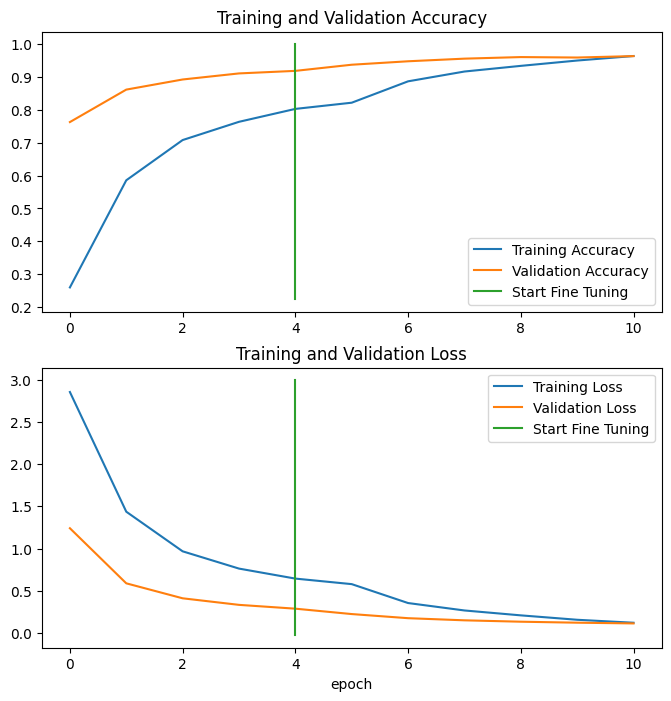

In [28]:
compare_historys(history_50_percent_resnet, history_50_percent_resnet_fine)

In [29]:
model_resnet_50_per.evaluate(val_ds)

550/550 ━━━━━━━━━━━━━━━━━━━━ 301s 547ms/step - accuracy: 0.9600 - loss: 0.1257


[0.11936325579881668, 0.9609037041664124]

### Prediction & Metrics

In [39]:
#loading model
from tensorflow.keras.models import load_model

model_resnet_50_per_load = load_model('dhruv_resnet_50.h5')
# Predicting with the loaded model
def predict_with_loaded_model(image_path, model, class_names):
    img = tf.keras.utils.load_img(image_path, target_size=(128, 128))
    img_array = tf.keras.utils.img_to_array(img)
    img_array = tf.keras.applications.resnet50.preprocess_input(img_array)
    img_array = np.expand_dims(img_array, axis=0)  # Shape: (1, 128, 128, 3)

    predictions = model.predict(img_array)
    predicted_index = np.argmax(predictions[0])
    confidence = float(np.max(predictions[0]))

    predicted_class = class_names[predicted_index]

    return predicted_class, confidence
# Load class names from file
with open("class_names.txt", "r") as f:
    class_names = [line.strip() for line in f]
# Predict
img_path = 'data_augm\sample_test_images\health_blueb.JPG'
predicted_class, confidence = predict_with_loaded_model(img_path, model_resnet_50_per_load, class_names)
print(f"Prediction: {predicted_class}")
print(f"Confidence: {confidence:.2f}")

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 798ms/step
Prediction: Blueberry___healthy
Confidence: 1.00


## 100%

In [2]:
train_ds = tf.keras.preprocessing.image_dataset_from_directory(
    "data_augm/train", image_size=(128, 128), batch_size=16)

val_ds = tf.keras.preprocessing.image_dataset_from_directory(
    "data_augm/valid", image_size=(128, 128), batch_size=16)

Found 70295 files belonging to 38 classes.
Found 17572 files belonging to 38 classes.


In [41]:
import tensorflow as tf
from tensorflow.keras.applications import ResNet50
from tensorflow.keras.layers import GlobalAveragePooling2D, Dense, Dropout
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau, ModelCheckpoint

# Load datasets
img_size = (128, 128)
batch_size = 16

num_classes = len(class_names)

AUTOTUNE = tf.data.AUTOTUNE
train_ds = train_ds.cache().shuffle(1000).prefetch(buffer_size=AUTOTUNE)
val_ds = val_ds.cache().prefetch(buffer_size=AUTOTUNE)

# Build base model
base_model = ResNet50(weights='imagenet', include_top=False, input_shape=(128, 128, 3))
base_model.trainable = False  # Freeze initially

# Custom head
x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dropout(0.5)(x)
x = Dense(256, activation='relu')(x)
x = Dropout(0.3)(x)
outputs = Dense(num_classes, activation='softmax')(x)

model_resnet_100_per = Model(inputs=base_model.input, outputs=outputs)

# Compile for feature extraction stage
model_resnet_100_per.compile(optimizer=Adam(1e-4),
              loss='sparse_categorical_crossentropy',
              metrics=['accuracy'])

# Callbacks
early_stop = EarlyStopping(monitor='val_loss', patience=4, restore_best_weights=True)
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=2)
model_ckpt = ModelCheckpoint("best_model.keras", save_best_only=True, monitor='val_loss')

# Train (Stage 1: Freeze Base)
history_100_percent_resnet = model_resnet_100_per.fit(train_ds,
                     epochs=5,
                     validation_data=val_ds,
                     callbacks=[early_stop, reduce_lr, model_ckpt])
# Save the model
model_resnet_100_per.save('dhruv_resnet_100.h5')

# Stage 2: Fine-tune top 50 layers
base_model.trainable = True
for layer in base_model.layers[:-25]:  # Freeze all but the last 25 layers
    layer.trainable = False

# Recompile with lower LR
model_resnet_100_per.compile(optimizer=Adam(1e-5),
              loss='sparse_categorical_crossentropy',
              metrics=['accuracy'])

# Fine-tune
history_100_percent_resnet_fine = model_resnet_100_per.fit(train_ds,
                     epochs=6,
                     validation_data=val_ds,
                     callbacks=[early_stop, reduce_lr, model_ckpt])

# Save & over-write the fine-tuned model
model_resnet_100_per.save('dhruv_resnet_100_fine.h5')


Epoch 1/5
3098/4394 ━━━━━━━━━━━━━━━━━━━━ 8:19 385ms/step - accuracy: 0.3593 - loss: 2.5363

: 

In [3]:
from helper_functions import *
from tensorflow.keras.models import load_model

# history_mobilenet = load_model('trial_leaf_disease_transfer_model.h5')
# history_mobilenet_fine = load_model('fine_tune_leaf_disease_transfer_model.h5')

# compare_historys(history_mobilenet, history_mobilenet_fine)

In [4]:
resnet_100 = load_model('ishan_resnet_100.h5')

In [7]:
resnet_100.evaluate(val_ds)

1099/1099 ━━━━━━━━━━━━━━━━━━━━ 404s 367ms/step - accuracy: 0.9799 - loss: 0.0612


[0.059923138469457626, 0.9808786511421204]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
Prediction: Tomato___healthy
Confidence: 1.00


(np.float64(-0.5), np.float64(127.5), np.float64(127.5), np.float64(-0.5))

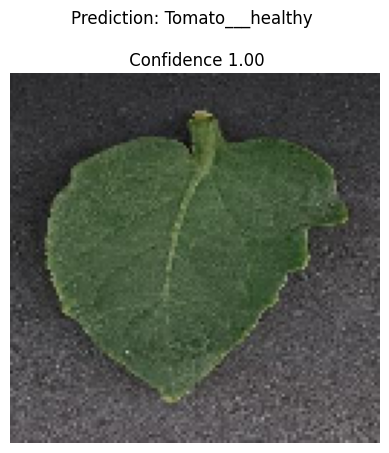

In [53]:
from tensorflow.keras.utils import load_img, img_to_array
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf


def predict_with_loaded_model(image_path, model, class_names):
    img = tf.keras.utils.load_img(image_path, target_size=(128, 128))
    img_array = tf.keras.utils.img_to_array(img)
    img_array = tf.keras.applications.resnet50.preprocess_input(img_array)
    img_array = np.expand_dims(img_array, axis=0)  # Shape: (1, 128, 128, 3)

    predictions = model.predict(img_array)
    predicted_index = np.argmax(predictions[0])
    confidence = float(np.max(predictions[0]))
    plt.imshow(img)
    predicted_class = class_names[predicted_index]

    return predicted_class, confidence
# Load class names from file
with open("class_names.txt", "r") as f:
    class_names = [line.strip() for line in f]
# Predict
img_path = 'data_augm\itest\TomatoHealthy2.JPG'
predicted_class, confidence = predict_with_loaded_model(img_path, resnet_100, class_names)
print(f"Prediction: {predicted_class}")
print(f"Confidence: {confidence:.2f}")
plt.title(f"Prediction: {predicted_class} \n\n Confidence {confidence:.2f}")
plt.axis('off')

In [4]:
from tensorflow.keras.utils import plot_model

In [ ]:
%pip install graphviz pydot

Note: you may need to restart the kernel to use updated packages.


In [6]:
# dir = 'model_plots.png'
# plot_model(resnet_100, to_file=dir, show_shapes=True, show_layer_names=True)

In [5]:
import numpy as np
import tensorflow as tf
from sklearn.metrics import confusion_matrix, classification_report
import matplotlib.pyplot as plt
import seaborn as sns

# Get true labels and predictions from val_ds
y_true = []
y_pred = []

for images, labels in val_ds:
    preds = resnet_100.predict(images, verbose=0)
    y_true.extend(labels.numpy())
    y_pred.extend(np.argmax(preds, axis=1))

y_true = np.array(y_true)
y_pred = np.array(y_pred)


In [26]:
import matplotlib.pyplot as plt
import numpy as np
import itertools
from sklearn.metrics import confusion_matrix

def make_confusion_matrix2(y_true,
                           y_pred,
                           classes=None,
                           figsize=(14, 14),
                           text_size=10,
                           norm=False,
                           savefig=False,
                           filename="confusion_matrix.png"):
    """
    Plots a labeled confusion matrix.
    """

    cm = confusion_matrix(y_true, y_pred)
    cm_norm = cm.astype("float") / cm.sum(axis=1)[:, np.newaxis] if norm else None
    n_classes = cm.shape[0]

    # Adjust figure size automatically for large numbers of classes
    if n_classes > 30:
        figsize = (max(18, n_classes * 0.4), max(18, n_classes * 0.4))

    fig, ax = plt.subplots(figsize=figsize)
    cax = ax.matshow(cm, cmap=plt.cm.Blues)
    fig.colorbar(cax)

    # Label setup
    labels = classes if classes else np.arange(n_classes)

    # Truncate long labels for display
    short_labels = [label[:30] + "..." if len(label) > 30 else label for label in labels]

    ax.set(title="Confusion Matrix",
        xlabel="Predicted label",
        ylabel="True label",
        xticks=np.arange(n_classes),
        yticks=np.arange(n_classes),
        xticklabels=short_labels,
        yticklabels=short_labels)


    ax.xaxis.set_label_position("bottom")
    ax.xaxis.tick_bottom()

    # Rotate x-axis labels for better alignment
    plt.setp(ax.get_xticklabels(),
             rotation=90,
             ha="right",
             rotation_mode="anchor",
             fontsize=text_size)
    plt.setp(ax.get_yticklabels(), fontsize=text_size)

    # Add gridlines
    ax.set_xticks(np.arange(n_classes + 1) - 0.5, minor=True)
    ax.set_yticks(np.arange(n_classes + 1) - 0.5, minor=True)
    ax.grid(which="minor", color="gray", linestyle=":", linewidth=0.5)
    ax.tick_params(which="minor", bottom=False, left=False)

    # Set the text threshold
    threshold = (cm.max() + cm.min()) / 2.

    # Add text annotations
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        if norm:
            text = f"{cm[i, j]}\n({cm_norm[i, j]*100:.1f}%)"
        else:
            text = str(cm[i, j])
        ax.text(j, i,
                text,
                ha="center", va="center",
                color="white" if cm[i, j] > threshold else "black",
                fontsize=text_size)

    plt.tight_layout()

    # Save figure
    if savefig:
        fig.savefig(filename, dpi=300, bbox_inches="tight")

    plt.show()


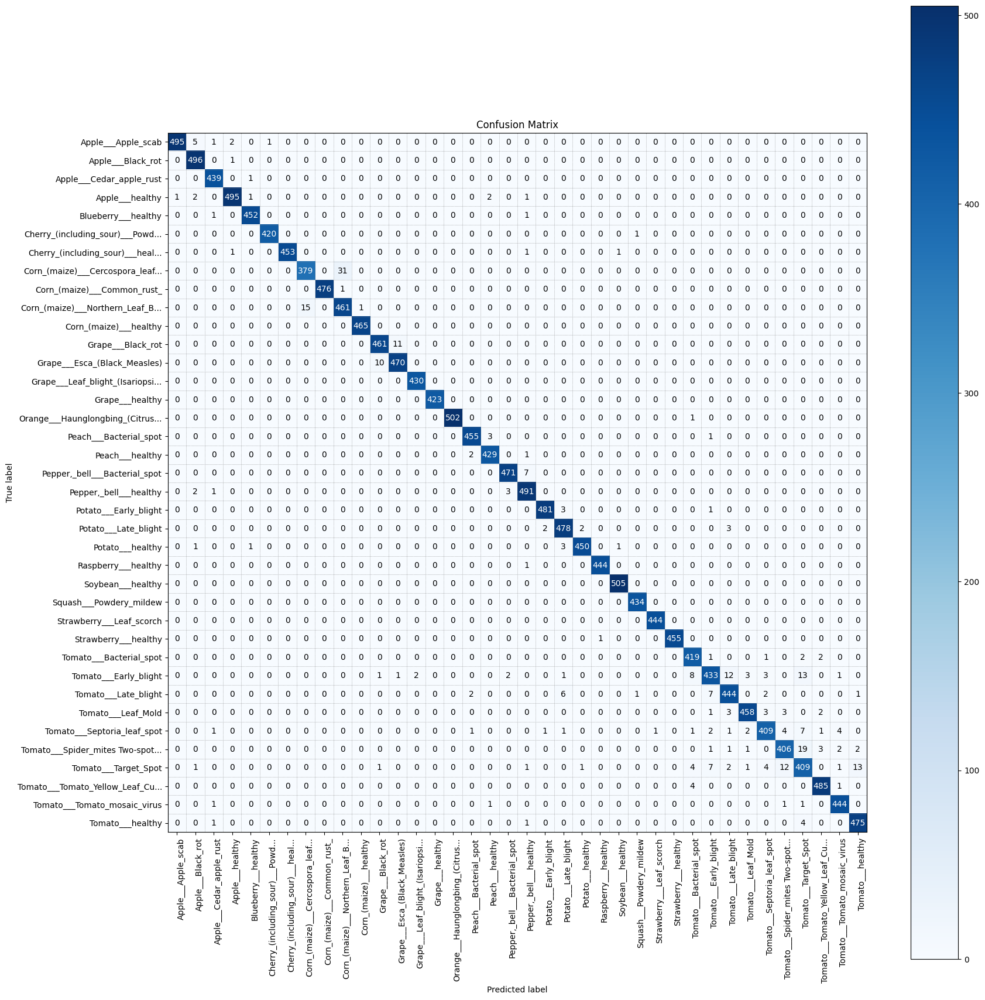

In [27]:
make_confusion_matrix2(y_true, y_pred, class_names)

In [29]:
calculate_results(y_true, y_pred)

{'accuracy': 98.08786706123378,
 'precision': np.float64(0.9808779928205309),
 'recall': np.float64(0.9808786706123378),
 'f1': np.float64(0.980814035275599)}

In [47]:
from sklearn.metrics import classification_report

# Generate classification report
report = classification_report(y_true, y_pred)
report

'              precision    recall  f1-score   support\n\n           0       1.00      0.98      0.99       504\n           1       0.98      1.00      0.99       497\n           2       0.99      1.00      0.99       440\n           3       0.99      0.99      0.99       502\n           4       0.99      1.00      0.99       454\n           5       1.00      1.00      1.00       421\n           6       1.00      0.99      1.00       456\n           7       0.96      0.92      0.94       410\n           8       1.00      1.00      1.00       477\n           9       0.94      0.97      0.95       477\n          10       1.00      1.00      1.00       465\n          11       0.97      0.98      0.98       472\n          12       0.98      0.98      0.98       480\n          13       1.00      1.00      1.00       430\n          14       1.00      1.00      1.00       423\n          15       1.00      1.00      1.00       503\n          16       0.99      0.99      0.99       459\n       

In [56]:
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.applications.resnet50 import preprocess_input

def predict_with_loaded_model(image_path, model, class_names):
    try:
        # Load and resize image
        img = tf.keras.utils.load_img(image_path, target_size=(128, 128))
        img_array = tf.keras.utils.img_to_array(img)

        # Preprocess using ResNet50's function
        img_array = preprocess_input(img_array)  # Applies BGR shift, mean subtraction
        img_array = np.expand_dims(img_array, axis=0)  # Shape: (1, 128, 128, 3)

        # Predict
        predictions = model.predict(img_array, verbose=0)
        predicted_index = np.argmax(predictions[0])
        confidence = float(np.max(predictions[0]))
        predicted_class = class_names[predicted_index]

        # Plot the image with prediction
        plt.imshow(img)
        plt.title(f"Prediction: {predicted_class} \nConfidence: {confidence:.2f}")
        plt.axis('off')
        plt.show()

        return predicted_class, confidence

    except FileNotFoundError:
        print(f"Image not found: {image_path}")
        return None, None



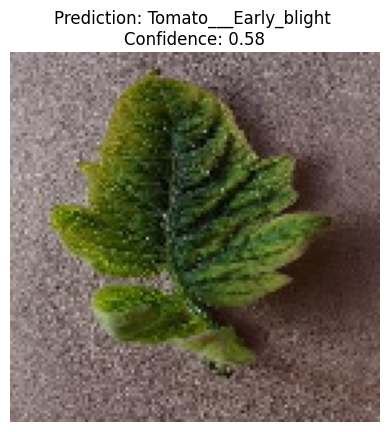

Predicted: Tomato___Early_blight (0.58)


In [66]:
# Load class names from text file
with open("class_names.txt", "r") as f:
    class_names = [line.strip() for line in f]

# Test image path
img_path = "data_augm/itest/TomatoYellowCurlVirus1.JPG"

# Predict
predicted_class, confidence = predict_with_loaded_model(img_path, model=resnet_100, class_names=class_names)
print(f"Predicted: {predicted_class} ({confidence:.2f})")



Total Test Images: 64
Correct Predictions: 0
Accuracy: 0.00

Showing 3 misclassified images:


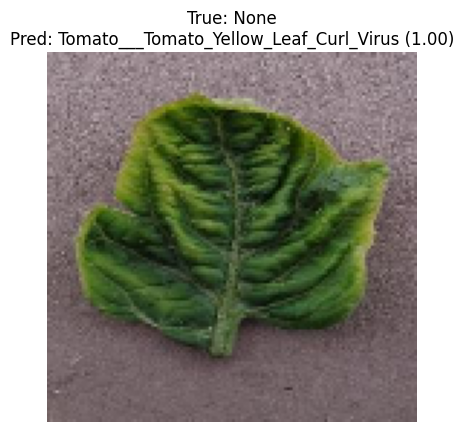

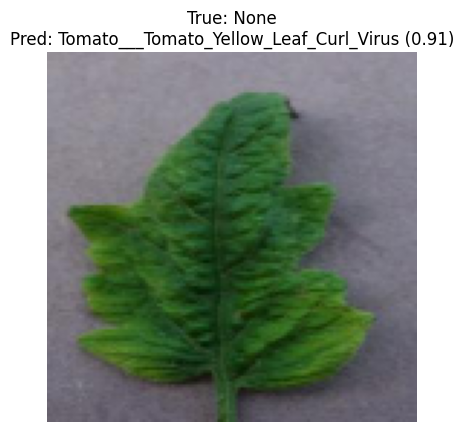

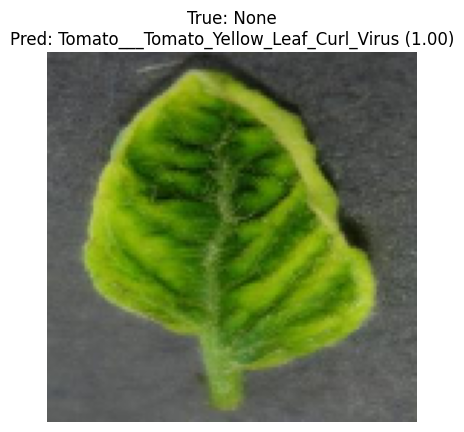

In [74]:
import os
import numpy as np
import tensorflow as tf
from tensorflow.keras.applications.resnet50 import preprocess_input
from tensorflow.keras.utils import load_img, img_to_array
import matplotlib.pyplot as plt

# ====== CONFIG ======
IMG_SIZE = (128, 128)
BATCH_SIZE = 1  # You can increase if needed
TEST_FOLDER = "data_augm/TomatoYellowCurl"  # Your test image folderD:\MACHINE LEARNING\Indus_Internship2\data_augm\valid\Tomato___Tomato_Yellow_Leaf_Curl_Virus
SHOW_ERRORS = True  # Show misclassified images
SHOW_LIMIT = 3      # Max number of errors to display

# Load class names
with open("class_names.txt", "r") as f:
    class_names = [line.strip() for line in f]

# Your trained model
model = resnet_100  # or your model variable

# Helper function
def predict_image(img_path):
    img = load_img(img_path, target_size=IMG_SIZE)
    img_array = img_to_array(img)
    img_array = preprocess_input(img_array)
    img_array = np.expand_dims(img_array, axis=0)
    preds = model.predict(img_array, verbose=0)
    predicted_index = np.argmax(preds[0])
    confidence = float(np.max(preds[0]))
    return class_names[predicted_index], confidence, preds[0]

# === Evaluate all images in folder ===
total = 0
correct = 0
errors = []

for filename in os.listdir(TEST_FOLDER):
    if filename.lower().endswith(('.jpg', '.jpeg', '.png')):
        total += 1
        img_path = os.path.join(TEST_FOLDER, filename)
        
        # Inferred true label (optional, from filename like Tomato___healthy_1.jpg)
        true_label = None
        for cls in class_names:
            if cls in filename:
                true_label = cls
                break

        predicted_class, conf, _ = predict_image(img_path)

        is_correct = (true_label == predicted_class)
        if is_correct:
            correct += 1
        elif SHOW_ERRORS:
            errors.append((img_path, true_label, predicted_class, conf))

# === Show overall results ===
print(f"\nTotal Test Images: {total}")
print(f"Correct Predictions: {correct}")
print(f"Accuracy: {correct / total:.2f}")

# === Show Misclassified Images ===
if SHOW_ERRORS and errors:
    print(f"\nShowing {min(len(errors), SHOW_LIMIT)} misclassified images:")
    for i, (path, true_lbl, pred_lbl, conf) in enumerate(errors[:SHOW_LIMIT]):
        img = load_img(path, target_size=IMG_SIZE)
        plt.imshow(img)
        plt.title(f"True: {true_lbl}\nPred: {pred_lbl} ({conf:.2f})")
        plt.axis('off')
        plt.show()
